Prepare data

In [1]:
import os
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time
import pandas as pd
import scipy
import crosschat as cc
import scanpy as sc

/Users/xinyiwang/.pyenv/versions/3.8.9/lib/python3.8/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.8 is maybe too old for this OS.
  warnings.warn(


In [6]:
# Covid severe3000 data
adata = sc.read_h5ad('../src/crosschat/data/covid3000.h5ad')
adata = cc.prepare_adata(adata, normalized=True, scaled=False, input='allgenes')

In [ ]:
all_LR, cofactor_input, complex_input = cc.load_files(species='human')

In [ ]:
_,_, L_ls, separate_L = cc.prepare_lr_sup_mtx(all_LR,complex_input,'L',ds_mtx,ds_geneNames)
_,_, R_ls, separate_R = cc.prepare_lr_sup_mtx(all_LR,complex_input,'R',ds_mtx,ds_geneNames)
ligand_exp_dict,receptor_exp_dict,cofactor_exp_dict = prepare_gene_exp_dict(L_ls,R_ls,separate_L,separate_R,cofactor_input,ds_geneNames,ds_mtx)
# Filter all_LR to only involve interacting ligand-receptor pairs
all_LR_filtered = filter_all_LR(all_LR, ligand_exp_dict, receptor_exp_dict, ncells, threshold = 0.005)
L_sup_mtx, all_LR_L_ind, L_ls, separate_L = prepare_lr_sup_mtx(all_LR_filtered,complex_input,'L',ds_mtx,ds_geneNames)
R_sup_mtx, all_LR_R_ind, R_ls, separate_R = prepare_lr_sup_mtx(all_LR_filtered,complex_input,'R',ds_mtx,ds_geneNames)

# Generated all needed data including:
# ds_geneNames, ds_mtx, ncells, adata, all_LR_filtered
# ligand_exp_dict, receptor_exp_dict, cofactor_exp_dict
# L/R_sup_mtx, L_ls, all_LR_L/R_ind, separate_L/R

Generate CCI visualization based on all genes

In [ ]:
# Load existing all_results
PARENT_DIR = os.getcwd()
dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/all_results_allgenes')
all_results = load_allresults(dir)

# Run multiscale clustering
#pca_embedding = adata.obsm['X_pca']
#all_results = multiscale_clustering(pca_embedding, min_scale=-1, max_scale=4, n_scale=100, n_tries=20)
#PARENT_DIR = os.getcwd()
#dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/all_results_allgenes')
#save_allresults(all_results,dir)

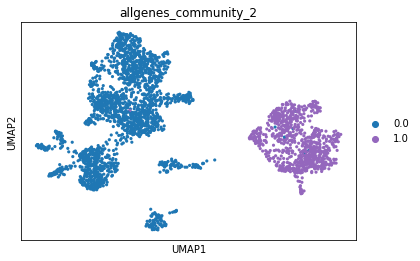

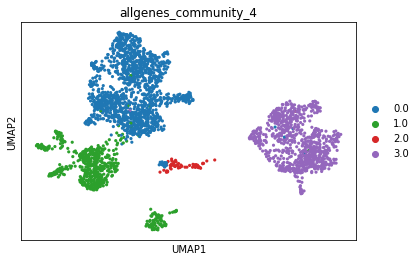

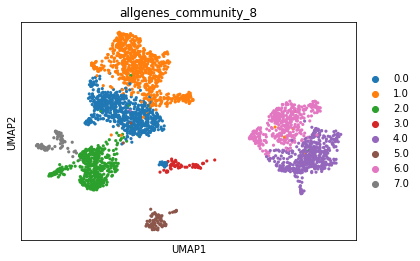

In [ ]:
selected_partitions,selected_comm_ids,comm_levels = select_partitions(all_results, max_nvi = 0.1,window_size = 15, basin_radius = 15)
draw_multiscale_umap('allgenes',adata,all_results,comm_levels,selected_partitions,selected_comm_ids,save=True)
#sc.pl.umap(adata, color="celltype_annotations",save='celltype_annotations.pdf')
#jaccard_dist(selected_comm_ids[-1],adata.obs['celltype_annotations'])

i). Find specific LR pairs

In [ ]:
allgenes_onehot_ls = get_onehot_ls(selected_comm_ids)
L_wilcox_dict = dict()
R_wilcox_dict = dict()
for gene in L_ls:
    gene_exp = compute_genes_geo_avg_vector(ligand_exp_dict[gene])
    wilcox_score = get_wilcox_score(gene_exp,allgenes_onehot_ls)
    L_wilcox_dict[gene] = wilcox_score
for gene in R_ls:
    gene_exp = compute_genes_geo_avg_vector(receptor_exp_dict[gene])
    wilcox_score = get_wilcox_score(gene_exp,allgenes_onehot_ls)
    R_wilcox_dict[gene] = wilcox_score

In [ ]:
columns = ['L_pval', 'L_scale', 'L_id']
for i,column in enumerate(columns):
    all_LR_filtered[column] = all_LR_filtered['Ligand'].map(lambda x:L_wilcox_dict[x][i])
columns = ['R_pval', 'R_scale', 'R_id']
for i,column in enumerate(columns):
    all_LR_filtered[column] = all_LR_filtered['Receptor'].map(lambda x:R_wilcox_dict[x][i])

all_LR_filtered['specificity']=all_LR_filtered.L_pval*all_LR_filtered.R_pval
all_LR_filtered_sorted = all_LR_filtered.sort_values('specificity')

ii). Draw CCI of specific LR pairs

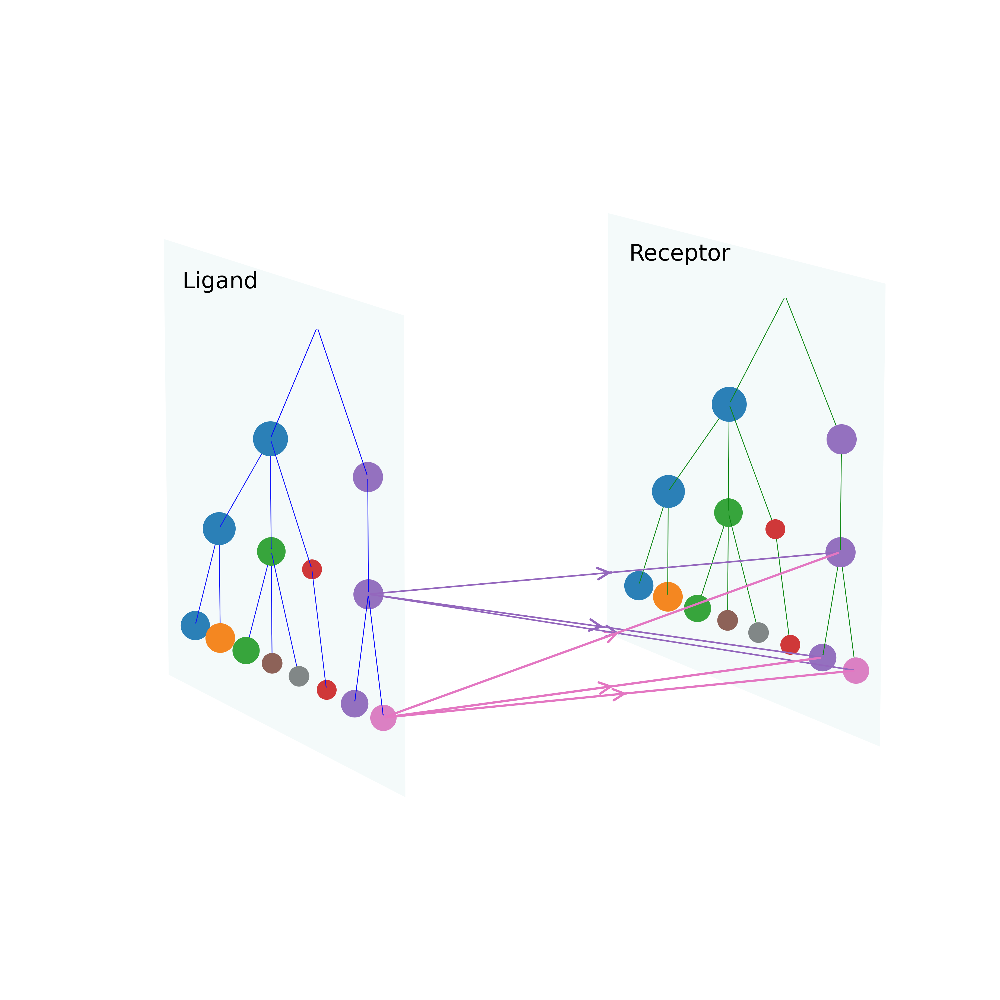

In [ ]:
CCI_threshold = 0.4
ligand = ['CCL3']
receptor = ['CCR1']
CCI_mtx = get_CCI_mtx(all_LR_filtered, ligand, receptor, allgenes_onehot_ls, allgenes_onehot_ls, ligand_exp_dict,receptor_exp_dict, cofactor_exp_dict, CCI_threshold)
CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(allgenes_onehot_ls))], axis=0) for r_level in range(len(allgenes_onehot_ls))], axis=1)
draw_CCI(allgenes_onehot_ls, allgenes_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1)

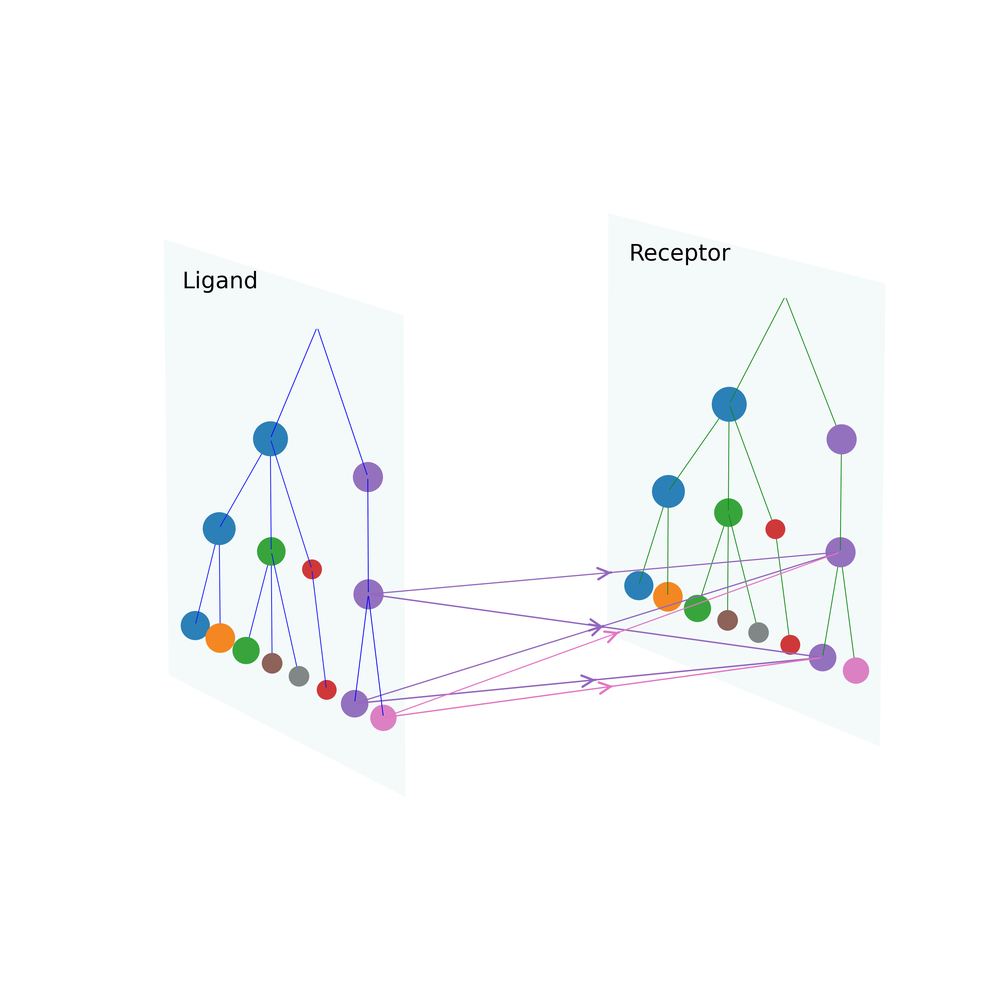

In [ ]:
CCI_threshold = 0.3
ligand = ['RETN']
receptor = ['TLR4']
CCI_mtx = get_CCI_mtx(all_LR_filtered, ligand, receptor, allgenes_onehot_ls, allgenes_onehot_ls, ligand_exp_dict,receptor_exp_dict, cofactor_exp_dict, CCI_threshold)
CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(allgenes_onehot_ls))], axis=0) for r_level in range(len(allgenes_onehot_ls))], axis=1)
draw_CCI(allgenes_onehot_ls, allgenes_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1)

In [ ]:
gene_ls = ['CCL3','CCR1','RETN','TLR4']
#for gene in gene_ls:
#    sc.pl.umap(adata, color=f"{gene}",cmap='GnBu',vmin=-1,vmax=4,save=f'{gene}.pdf')

iii). Downstream: Cluster specific LR pairs

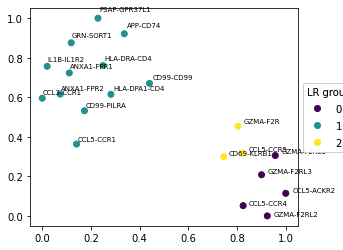

In [ ]:
n_specific_LR = 20
specific_LRs = [x[0]+'-'+x[1] for x in all_LR_filtered_sorted.iloc[0:n_specific_LR][['Ligand','Receptor']].values]
L_exp_in_clusters,R_exp_in_clusters = get_lr_exp_in_allgenes_clusters(n_specific_LR,allgenes_onehot_ls,all_LR_filtered_sorted,ligand_exp_dict,receptor_exp_dict)
u,kmeans = cluster_exp_ls(L_exp_in_clusters,R_exp_in_clusters,all_results,all_results,comm_levels,comm_levels)

u[:,0] = (u[:,0] - np.min(u[:,0])) / (np.max(u[:,0]) - np.min(u[:,0]))
u[:,1] = (u[:,1] - np.min(u[:,1])) / (np.max(u[:,1]) - np.min(u[:,1]))

fig = plt.figure()
ax = plt.subplot(111)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
scatter = ax.scatter(u[:, 0],u[:, 1],c=kmeans.labels_)

sampled_id = np.random.choice(n_specific_LR, size = int(n_specific_LR),replace=False)
y_error = np.random.normal(0, 2e-3, int(n_specific_LR))
for i, LR_pair in enumerate(specific_LRs):
    if i in sampled_id:
        ax.annotate(LR_pair, (u[i,0], u[i,1]), textcoords='offset fontsize', fontsize=7)
legend1 = ax.legend(*scatter.legend_elements(),
                    loc='center left', bbox_to_anchor=(1, 0.5), title="LR groups", alignment='left')
ax.add_artist(legend1)

CCI visualization of each pathway between general L/R tree

i). CCI between general L and general R

In [ ]:
# Load existing all_results
PARENT_DIR = os.getcwd()
dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/L_all_results')
L_all_results = load_allresults(dir)
dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/R_all_results')
R_all_results = load_allresults(dir)

In [ ]:
# Multiscale clustering on L_mtx and R_mtx
L_mtx = np.concatenate([ligand_exp_dict[L_ls[i]] for i in range(len(L_ls))],axis=0).T
R_mtx = np.concatenate([receptor_exp_dict[R_ls[i]] for i in range(len(R_ls))],axis=0).T
#pca = PCA(n_components=50)
#L_pca = pca.fit_transform(L_mtx)
#R_pca = pca.fit_transform(R_mtx)
#L_all_results = multiscale_clustering(L_pca, min_scale=-1, max_scale=4, n_scale=100, n_tries=20)
#R_all_results = multiscale_clustering(R_pca, min_scale=-1, max_scale=4, n_scale=100, n_tries=20)
#PARENT_DIR = os.getcwd()
#dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/L_all_results')
#save_allresults(L_all_results,dir)
#dir = os.path.join(PARENT_DIR, 'Saved_files/sev3000/R_all_results')
#save_allresults(R_all_results,dir)

[2, 3, 7] [2, 5]


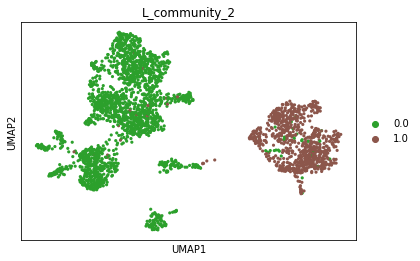

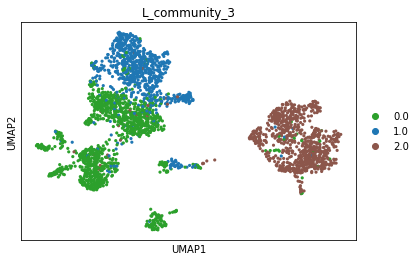

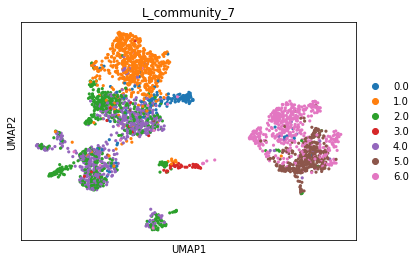

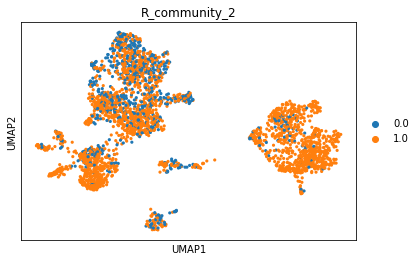

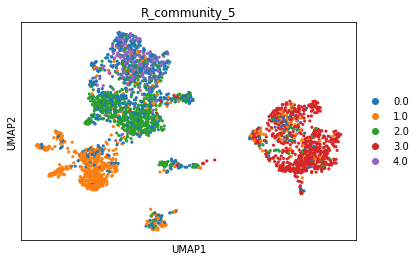

In [ ]:
L_selected_partitions,L_selected_comm_ids,L_comm_levels = select_partitions(L_all_results, max_nvi = 0.1,window_size = 6,basin_radius = 10)
R_selected_partitions,R_selected_comm_ids,R_comm_levels = select_partitions(R_all_results, max_nvi = 0.1,window_size = 6,basin_radius = 10)
print(L_comm_levels,R_comm_levels)
draw_multiscale_umap('L',adata,L_all_results,L_comm_levels,L_selected_partitions,L_selected_comm_ids,save=True)
draw_multiscale_umap('R',adata,R_all_results,R_comm_levels,R_selected_partitions,R_selected_comm_ids,save=True)
#sc.pl.umap(adata, color="celltype_annotations")

In [ ]:
# Assign top marker gene to each cluster
L_adata = adata[:,sum(separate_L,[])].copy()
R_adata = adata[:,sum(separate_R,[])].copy()
L_marker_ls = assign_top_marker_to_cluster(L_adata,'L',L_comm_levels)
R_marker_ls = assign_top_marker_to_cluster(R_adata,'R',R_comm_levels)

In [ ]:
'''
keys = ['scales',
 'number_of_communities',
 'stability',
 'community_id',
 'NVI',
 'ttprime',
 'block_detection_curve',
 'selected_partitions']

# Load all results
for lr in ['L','R']:
    globals()[f'{lr}_all_results'] = dict()
for lr in ['L','R']:
    globals()[f'{lr}_all_results'] = dict()
    for key in keys:
        # Wound healing data
        globals()[f'{lr}_all_results'][key] = np.loadtxt("/Users/xinyiwang/Desktop/Current_Research/Multiscale_CCI/wound_healing/w_{lr}_all_results/{key}.csv".format(key=key,lr=lr))
        # Mouse embryonic data
        # globals()[f'{lr}_all_results'][key] = np.loadtxt("/Users/xinyiwang/Desktop/Current_Research/Multiscale_CCI/mouse_embryonic_skin_sample1/all_results_{lr}_ge/{key}.csv".format(key=key,lr=lr))
L_selected_partitions,L_selected_comm_ids,L_comm_levels = select_partitions(L_all_results, max_nvi = 0.1,window_size = 15,basin_radius = 15)
R_selected_partitions,R_selected_comm_ids,R_comm_levels = select_partitions(R_all_results, max_nvi = 0.1,window_size = 15,basin_radius = 15)
# Wound healing data
#L_comm_levels = [7,13]
#L_selected_partitions = L_selected_partitions[1:]
'''

'\nkeys = [\'scales\',\n \'number_of_communities\',\n \'stability\',\n \'community_id\',\n \'NVI\',\n \'ttprime\',\n \'block_detection_curve\',\n \'selected_partitions\']\n\n# Load all results\nfor lr in [\'L\',\'R\']:\n    globals()[f\'{lr}_all_results\'] = dict()\nfor lr in [\'L\',\'R\']:\n    globals()[f\'{lr}_all_results\'] = dict()\n    for key in keys:\n        # Wound healing data\n        globals()[f\'{lr}_all_results\'][key] = np.loadtxt("/Users/xinyiwang/Desktop/Current_Research/Multiscale_CCI/wound_healing/w_{lr}_all_results/{key}.csv".format(key=key,lr=lr))\n        # Mouse embryonic data\n        # globals()[f\'{lr}_all_results\'][key] = np.loadtxt("/Users/xinyiwang/Desktop/Current_Research/Multiscale_CCI/mouse_embryonic_skin_sample1/all_results_{lr}_ge/{key}.csv".format(key=key,lr=lr))\nL_selected_partitions,L_selected_comm_ids,L_comm_levels = select_partitions(L_all_results, max_nvi = 0.1,window_size = 15,basin_radius = 15)\nR_selected_partitions,R_selected_comm_ids,R_co

In [ ]:
L_onehot_ls = get_onehot_ls(L_selected_comm_ids)
R_onehot_ls = get_onehot_ls(R_selected_comm_ids)

pathways = np.unique(all_LR_filtered['pathway_name'])
pathway_total_CCI_ls = []
for pathway in pathways:
    pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
    CCI_mtx = get_CCI_mtx(all_LR_filtered, pathway_ligands, pathway_receptors, L_onehot_ls, R_onehot_ls,ligand_exp_dict,receptor_exp_dict,
                    cofactor_exp_dict, CCI_threshold=0.3)
    CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(L_onehot_ls))], axis=0) for r_level in range(len(R_onehot_ls))], axis=1)
    pathway_total_CCI_ls.append(np.sum(CCI_mtx))

active_pathways = pathways[np.where(np.asarray(pathway_total_CCI_ls)>0)[0]]

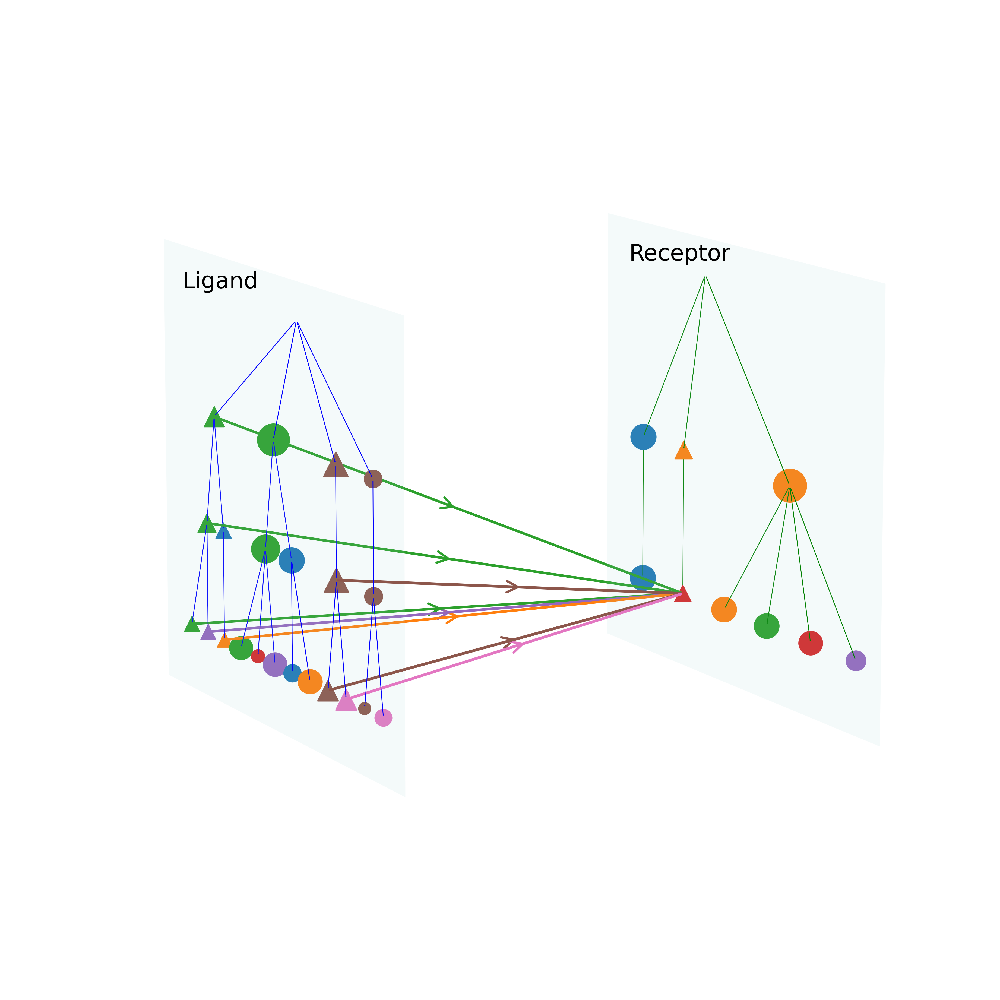

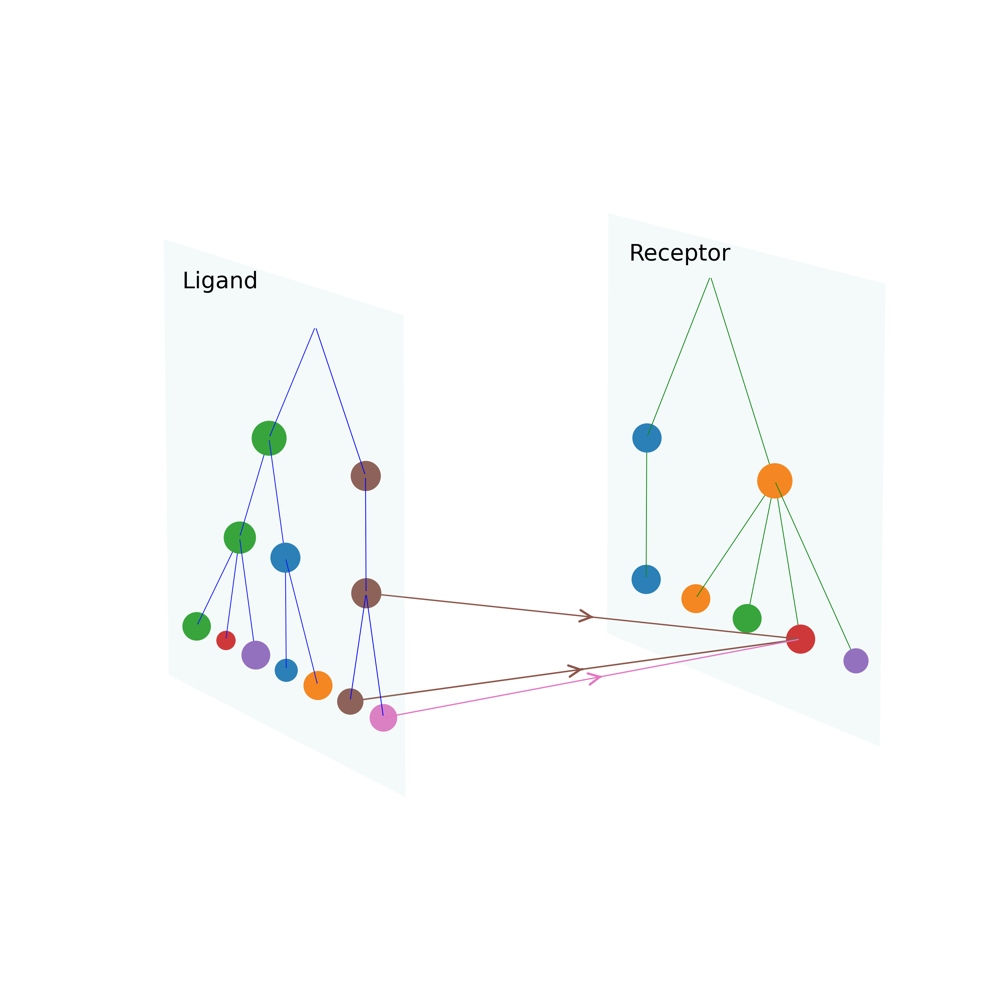

In [ ]:
pathway = 'GRN'
draw_intersected_CCI(pathway,all_LR_filtered,L_ls,R_ls,L_onehot_ls,R_onehot_ls,L_sup_mtx,R_sup_mtx,
                     ligand_exp_dict,receptor_exp_dict,cofactor_exp_dict,CCI_threshold=0.5,CCI_linewidth=3,CCI_nodesize=1,save=f'{pathway}_intersected_CCI.pdf')
pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
CCI_mtx = get_CCI_mtx(all_LR_filtered, pathway_ligands, pathway_receptors, L_onehot_ls, R_onehot_ls,ligand_exp_dict,receptor_exp_dict,
                cofactor_exp_dict, CCI_threshold=0.3)
CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(L_onehot_ls))], axis=0) for r_level in range(len(R_onehot_ls))], axis=1)
draw_CCI(L_onehot_ls, R_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1,save=f'{pathway}_CCI.pdf')

ii). Downstream: Pathway clustering

In [ ]:
L_Markov_time_ls = get_Markov_time_ls(L_all_results,L_comm_levels)
R_Markov_time_ls = get_Markov_time_ls(R_all_results,R_comm_levels)

# Pathway gene expression list
pathway_L_exp_ls = []
pathway_R_exp_ls = []

for pathway in active_pathways:
    pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
    pathway_ligands_gene_exp = np.zeros(ncells)
    pathway_receptors_gene_exp = np.zeros(ncells)
    for pathway_ligand in pathway_ligands:
        pathway_ligands_gene_exp += compute_genes_geo_avg_vector(ligand_exp_dict[pathway_ligand])
    for pathway_receptor in pathway_receptors:
        pathway_receptors_gene_exp += compute_genes_geo_avg_vector(receptor_exp_dict[pathway_receptor])

    pathway_L_exp_ls.append(pathway_ligands_gene_exp)
    pathway_R_exp_ls.append(pathway_receptors_gene_exp)

In [ ]:
pathway_L_exp_in_clusters = [] # ligand expression average in each multiscale cluster for all pathways
pathway_R_exp_in_clusters = []

for k in range(len(active_pathways)):
    pathway_L_k = []
    pathway_R_k = []
    for i in range(len(L_onehot_ls)):
        pathway_L_k.append(np.matmul(L_onehot_ls[i], pathway_L_exp_ls[k]) / np.sum(L_onehot_ls[i], axis=1))
    for i in range(len(R_onehot_ls)):
        pathway_R_k.append(np.matmul(R_onehot_ls[i], pathway_R_exp_ls[k]) / np.sum(R_onehot_ls[i], axis=1))
    pathway_L_exp_in_clusters.append(np.concatenate(pathway_L_k,axis=0))
    pathway_R_exp_in_clusters.append(np.concatenate(pathway_R_k,axis=0))

CCL


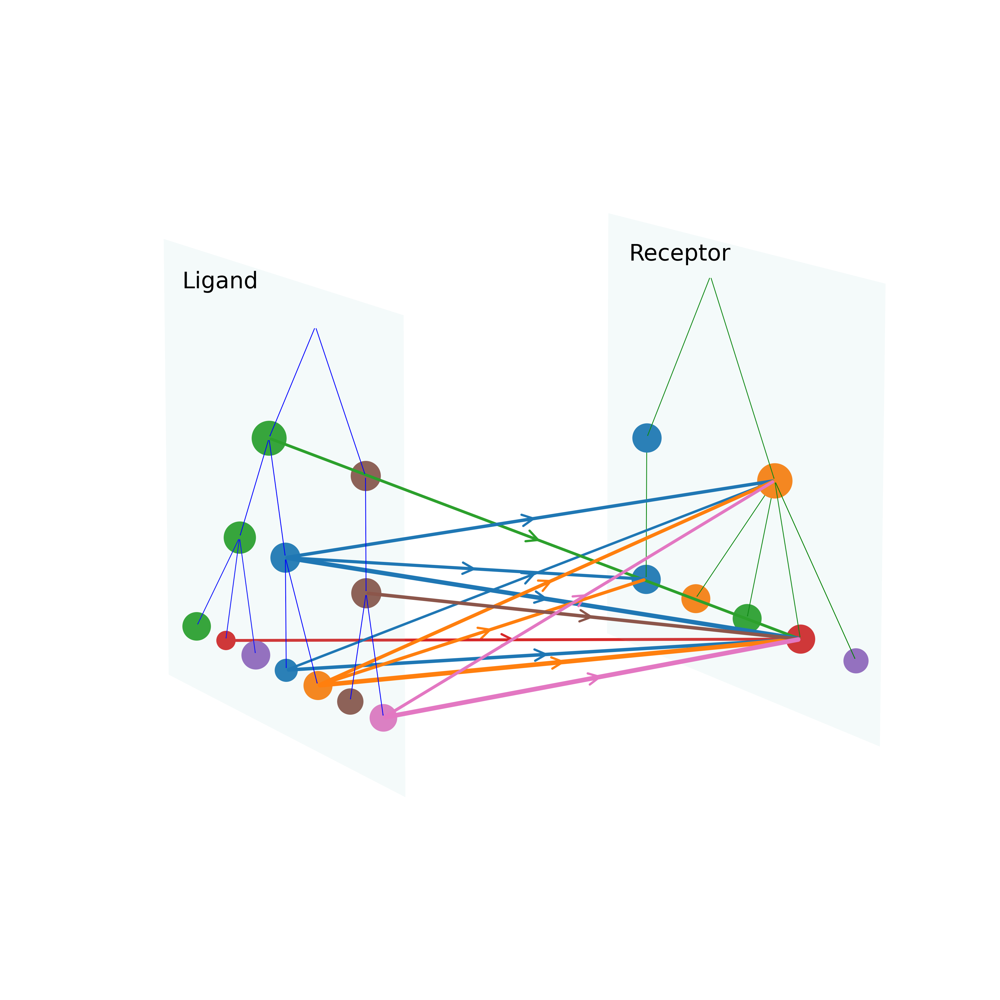

IFN-II


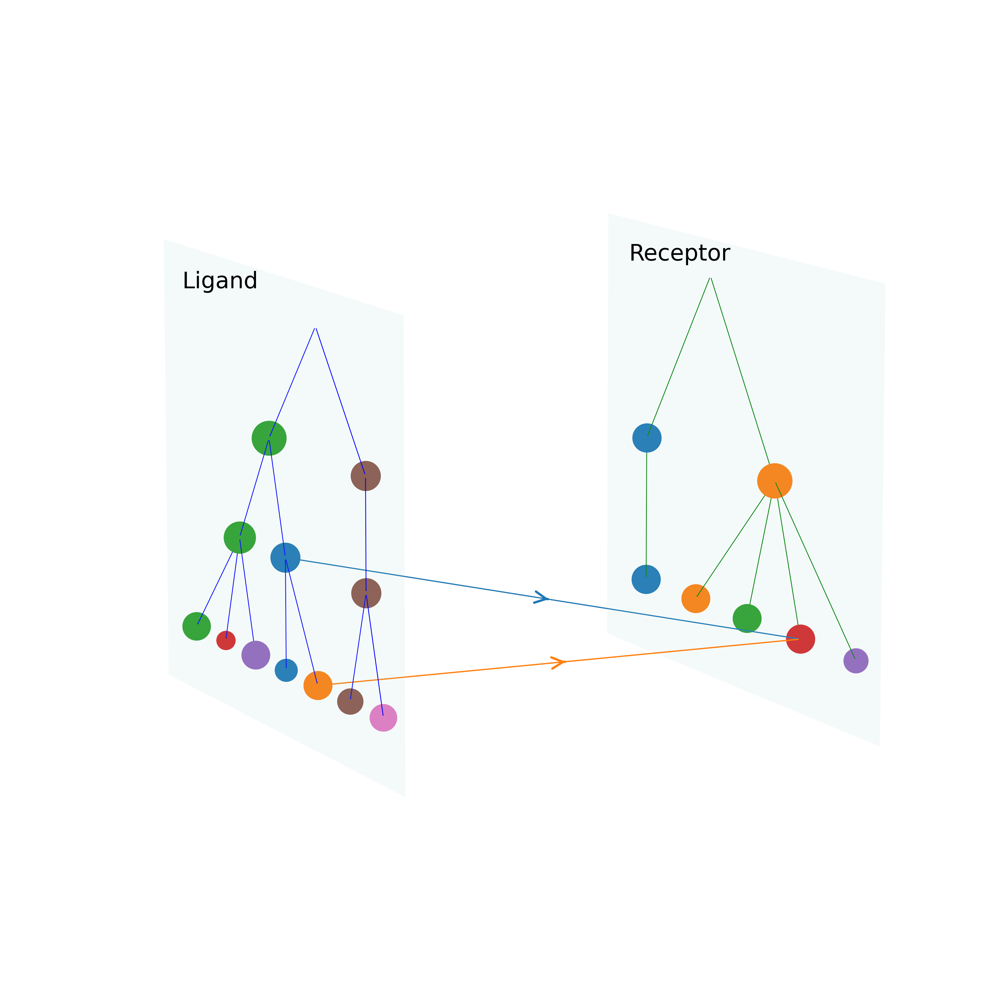

PARs


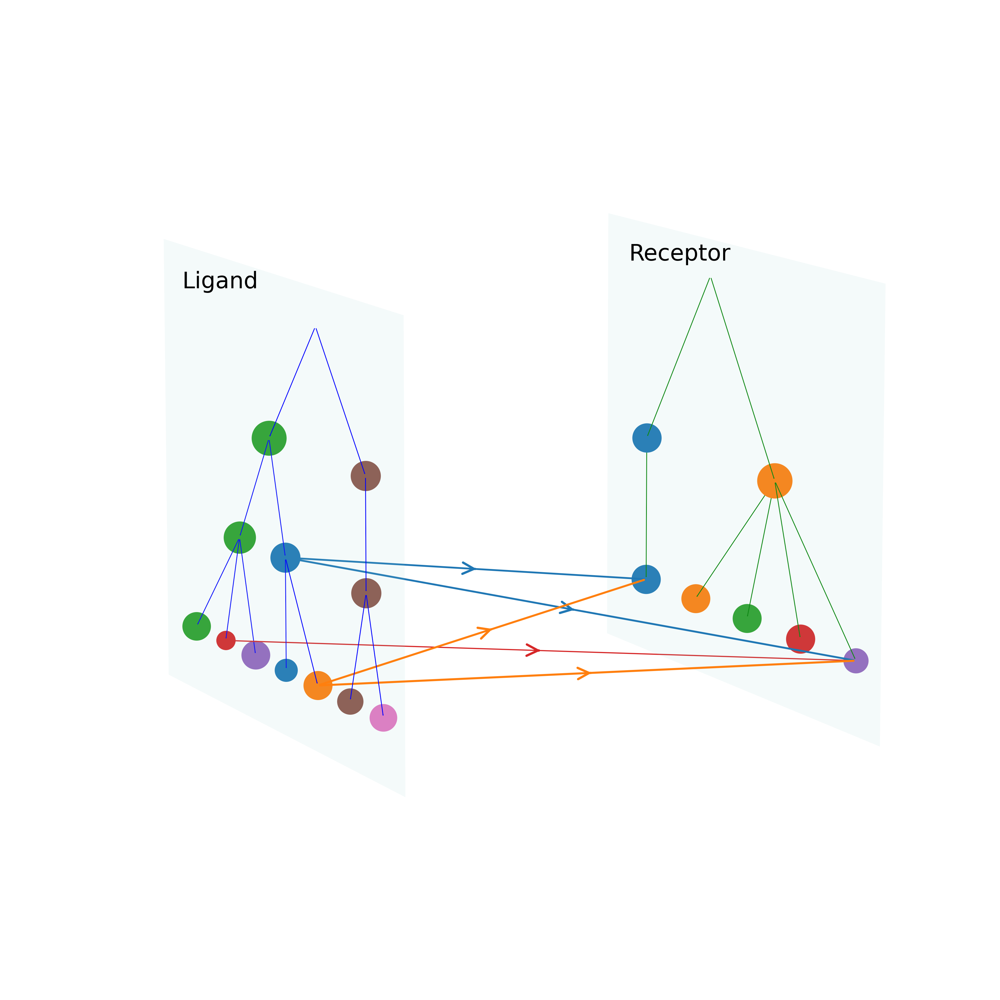

GP1BA


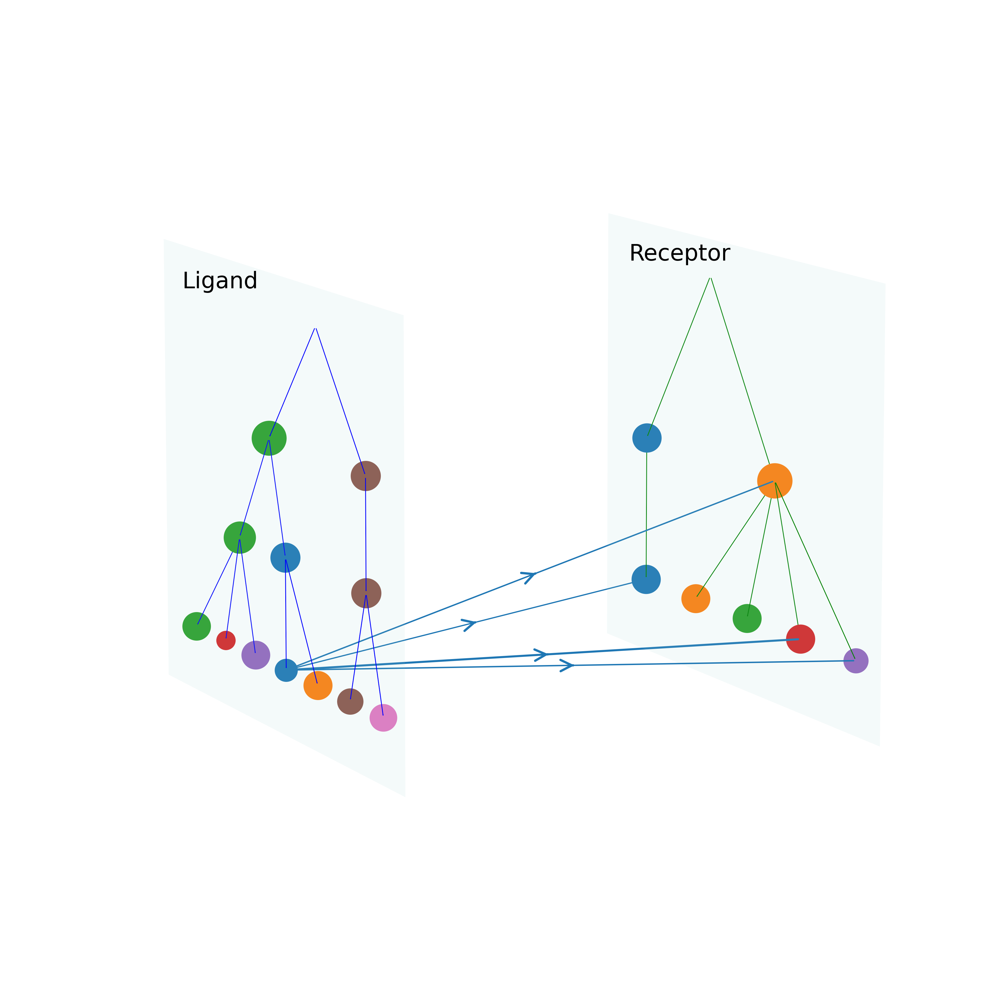

ITGAL_ITGB2


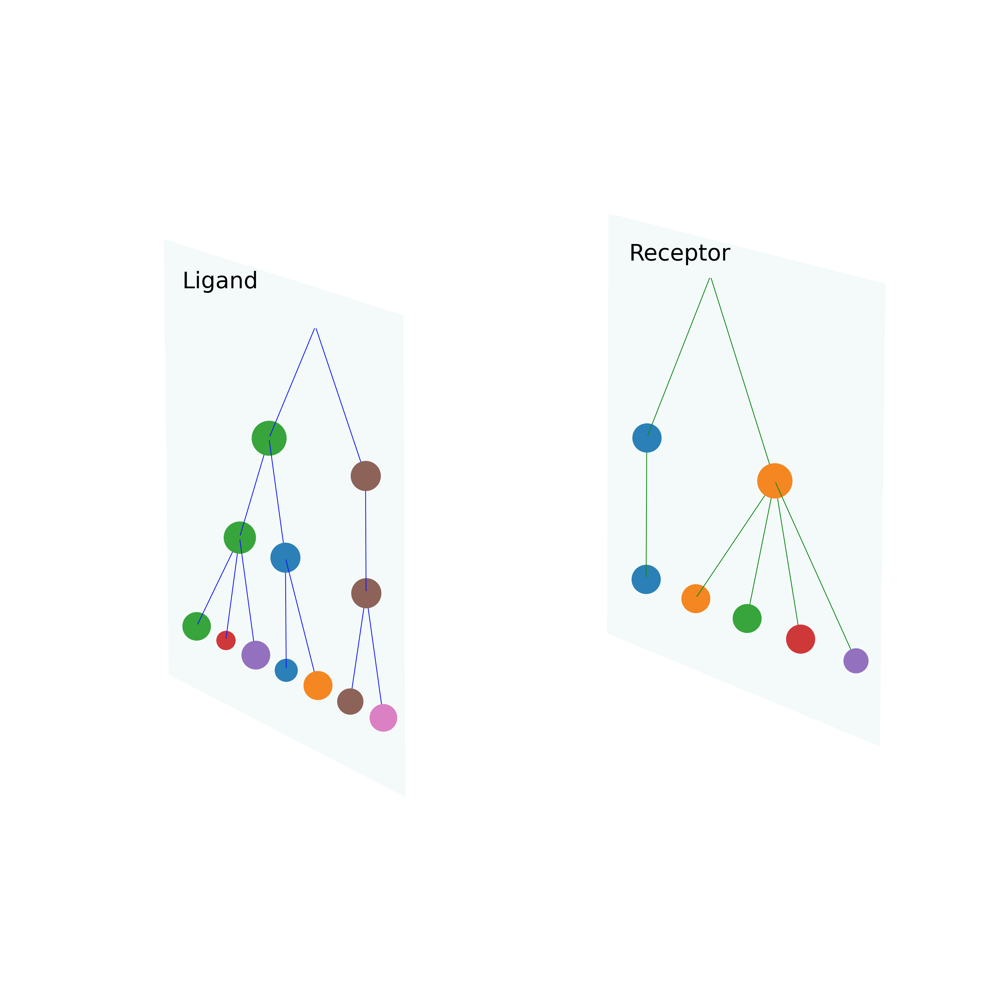

CD99


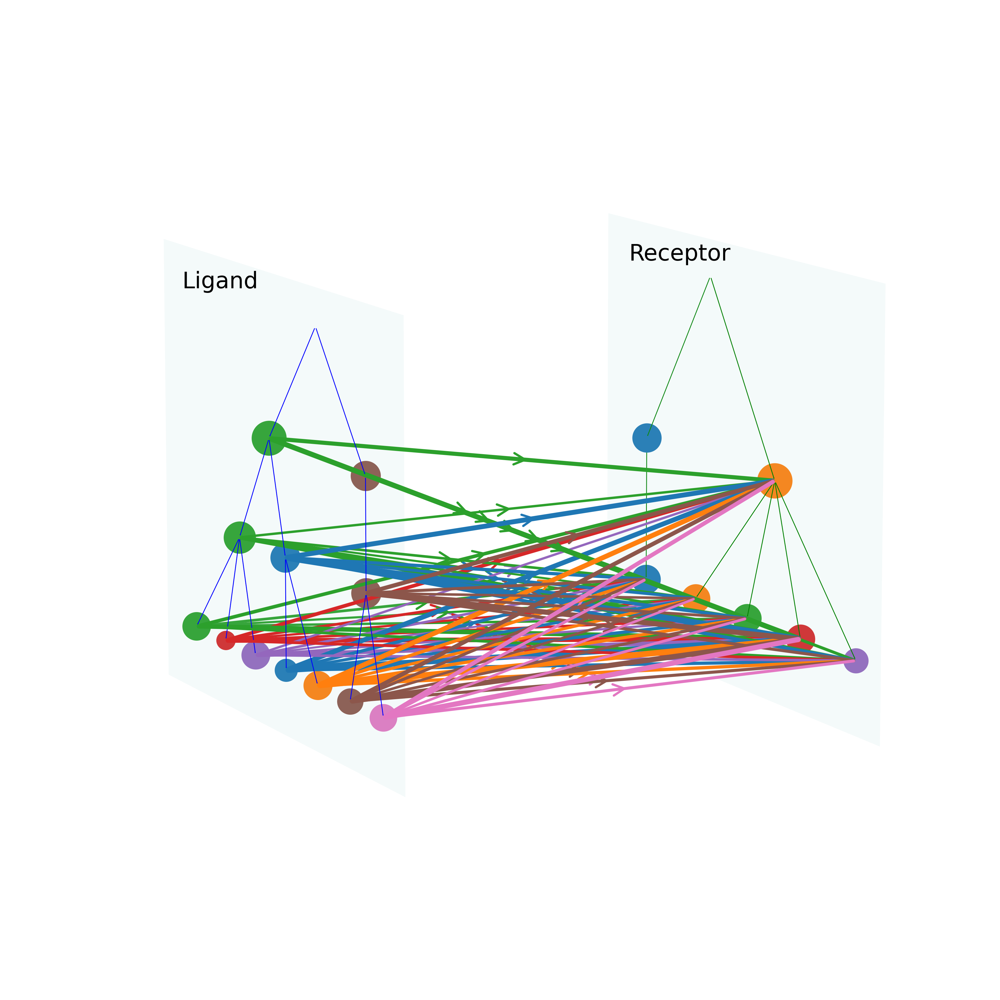

TNF


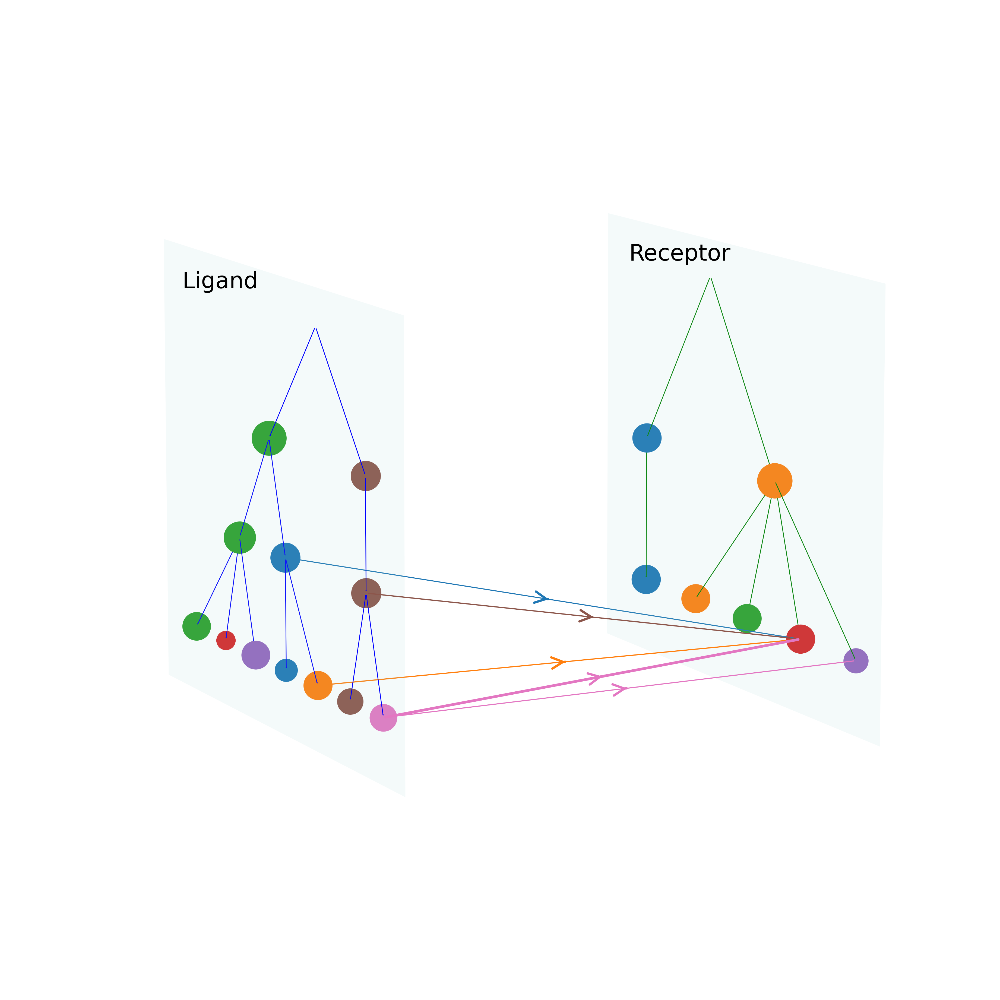

TGFb


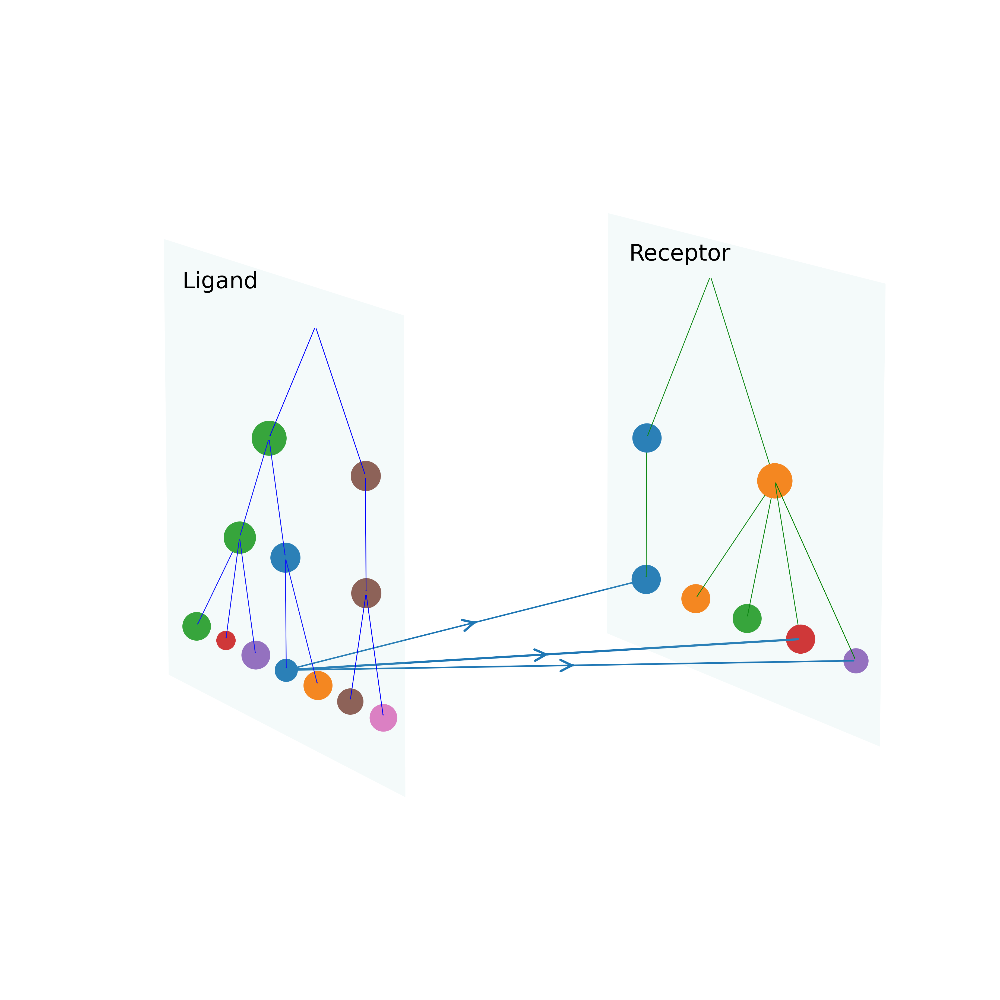

SELPLG


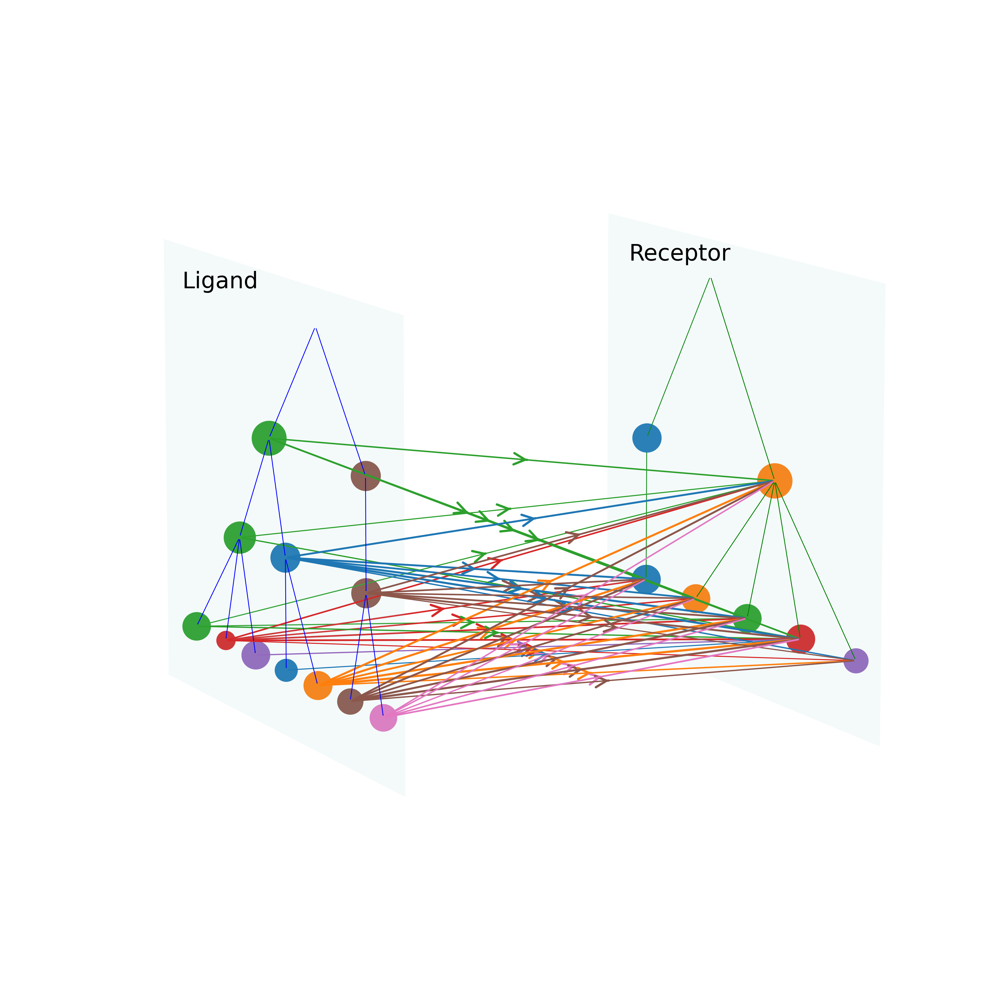

In [ ]:
for pathway in ['CCL','IFN-II','PARs','GP1BA','ITGAL_ITGB2','CD99','TNF','TGFb','SELPLG']:
    print(pathway)
    pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
    CCI_mtx = get_CCI_mtx(all_LR_filtered, pathway_ligands, pathway_receptors, L_onehot_ls, R_onehot_ls,ligand_exp_dict,receptor_exp_dict,
                    cofactor_exp_dict, CCI_threshold=0.3)
    CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(L_onehot_ls))], axis=0) for r_level in range(len(R_onehot_ls))], axis=1)
    draw_CCI(L_onehot_ls, R_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1,save=f'{pathway}_CCI.pdf')

LT


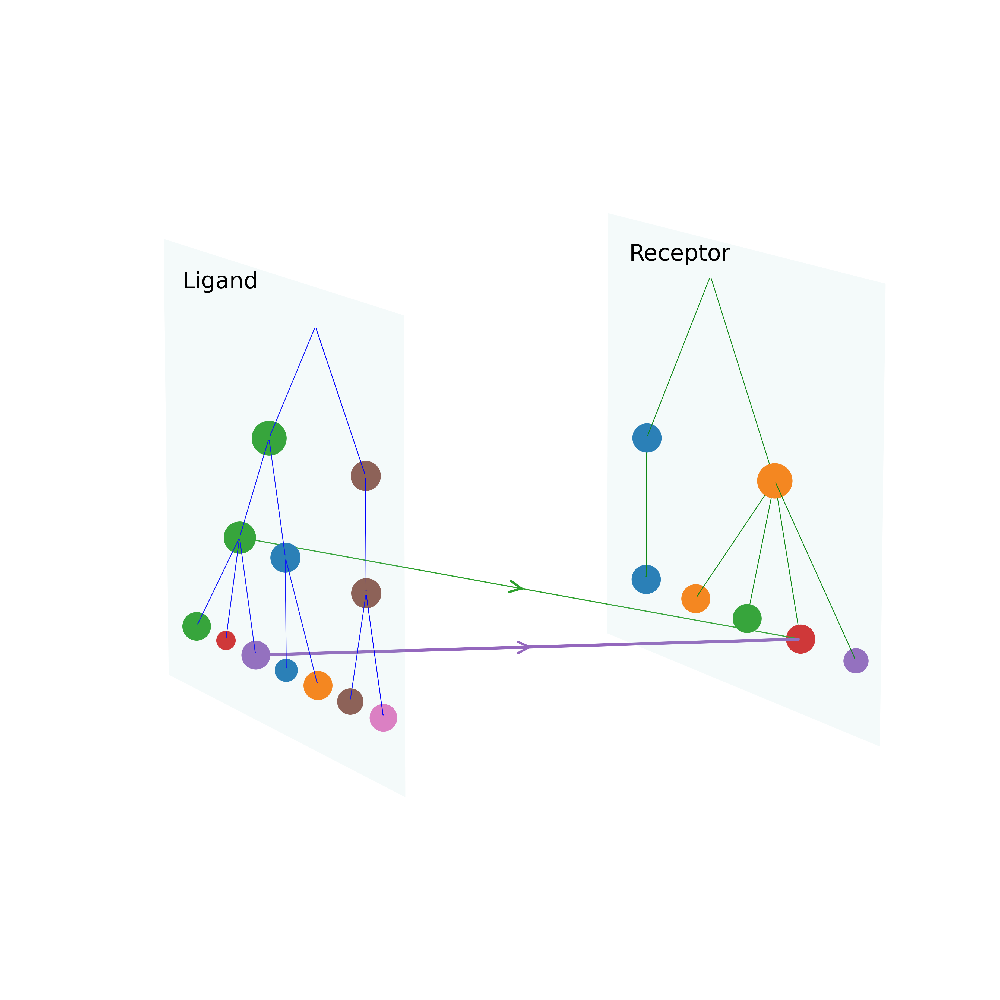

CD22


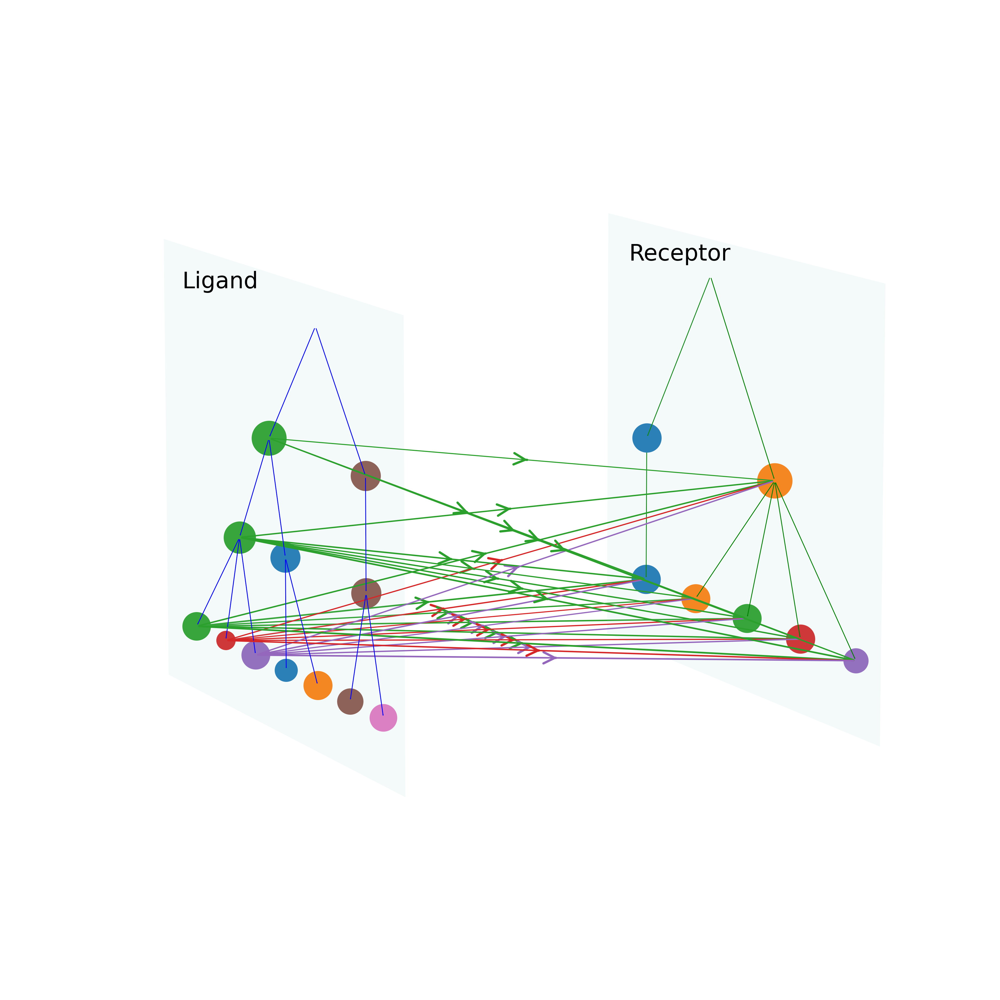

MIF


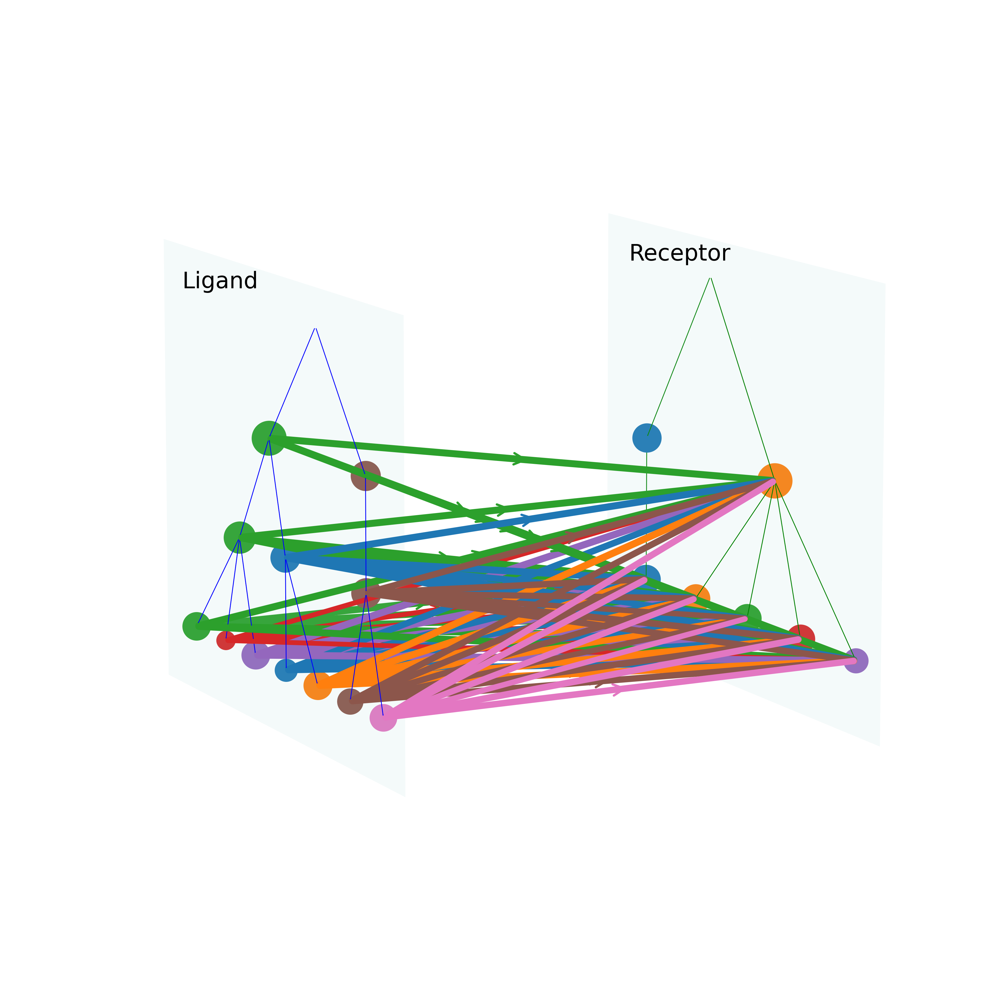

BAFF


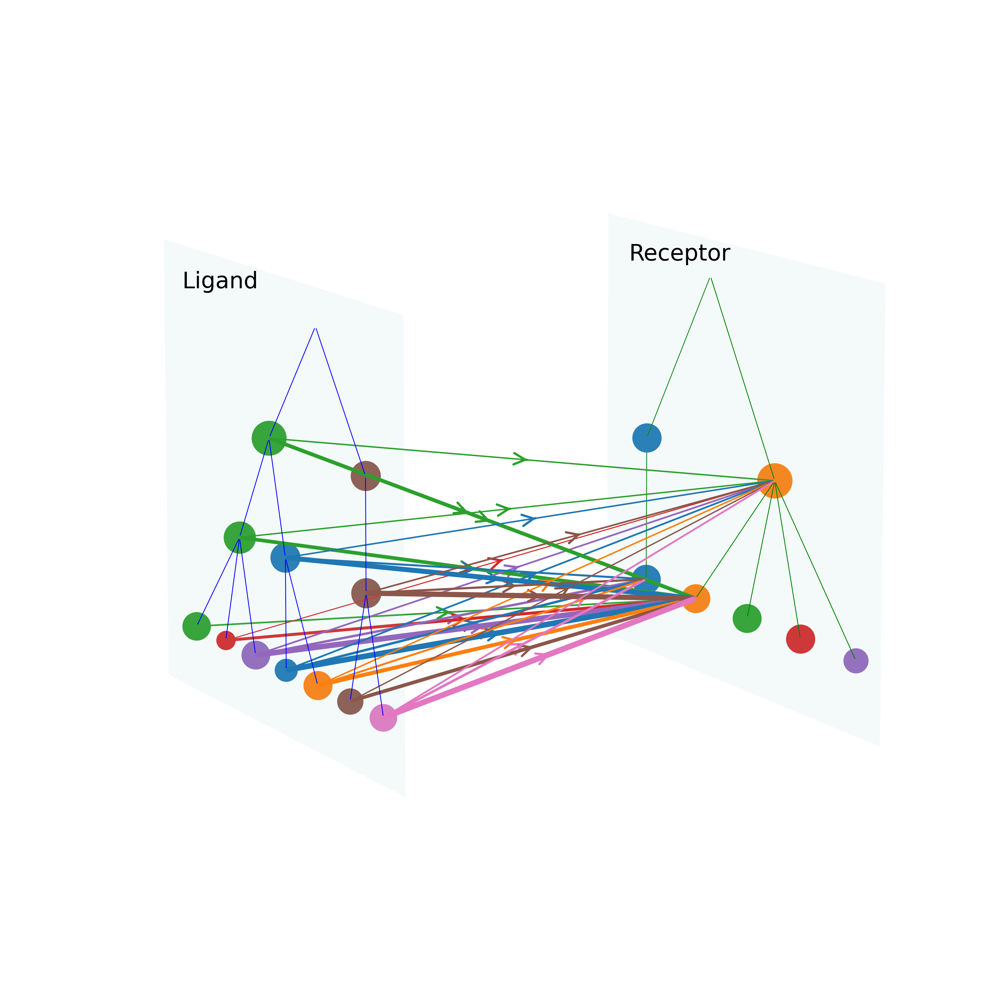

CD45


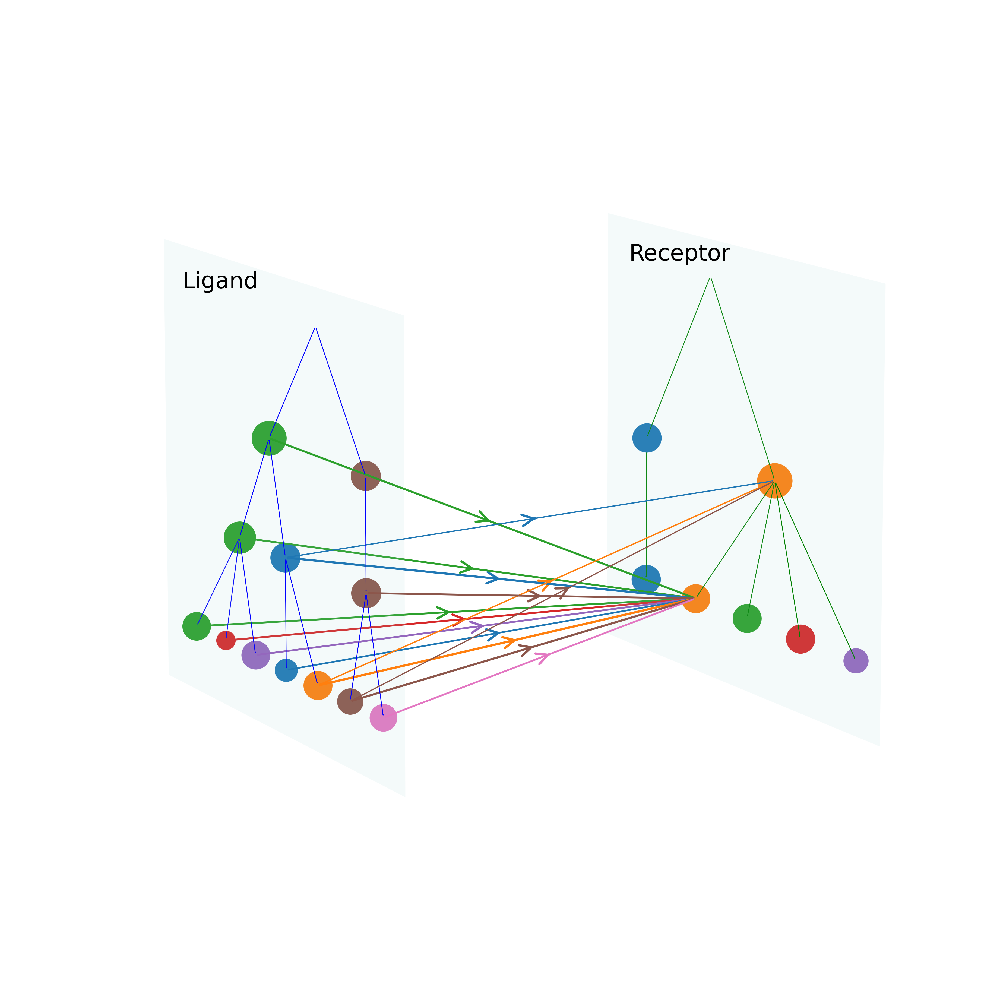

CLDN


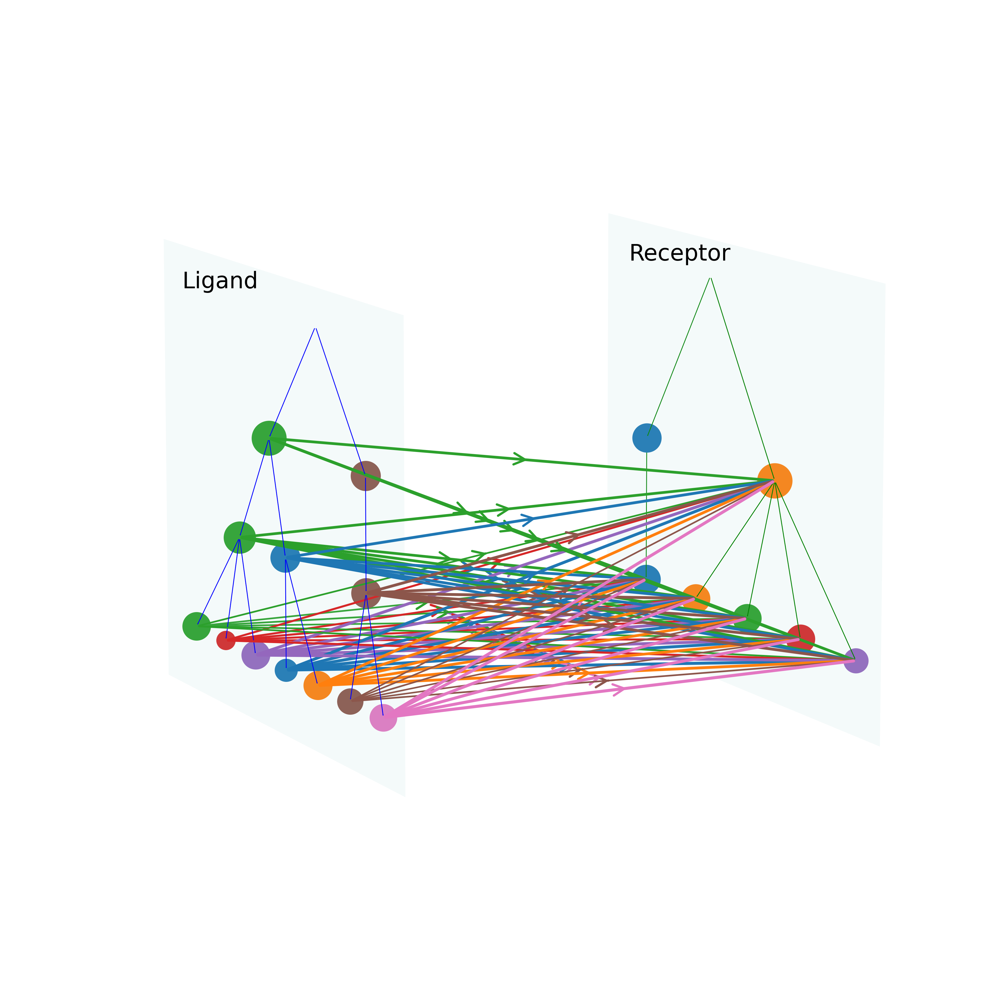

ICAM


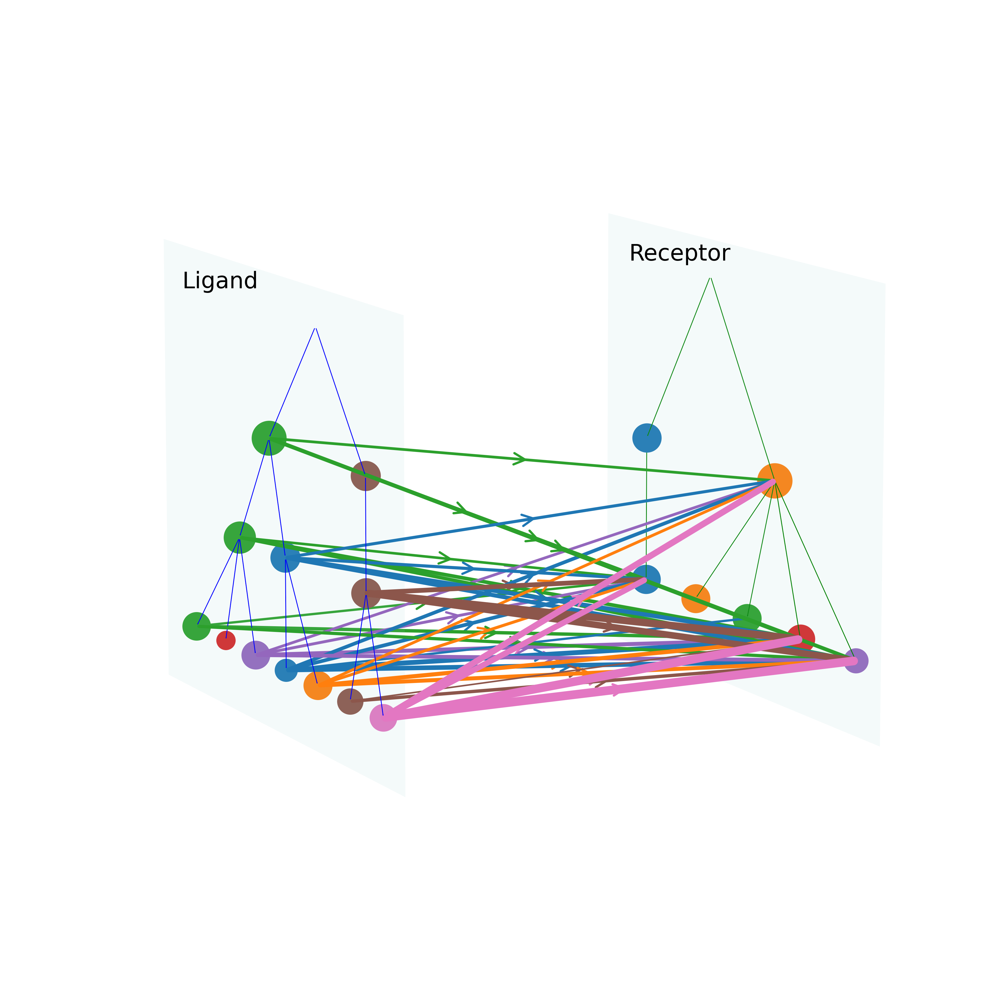

CXCL


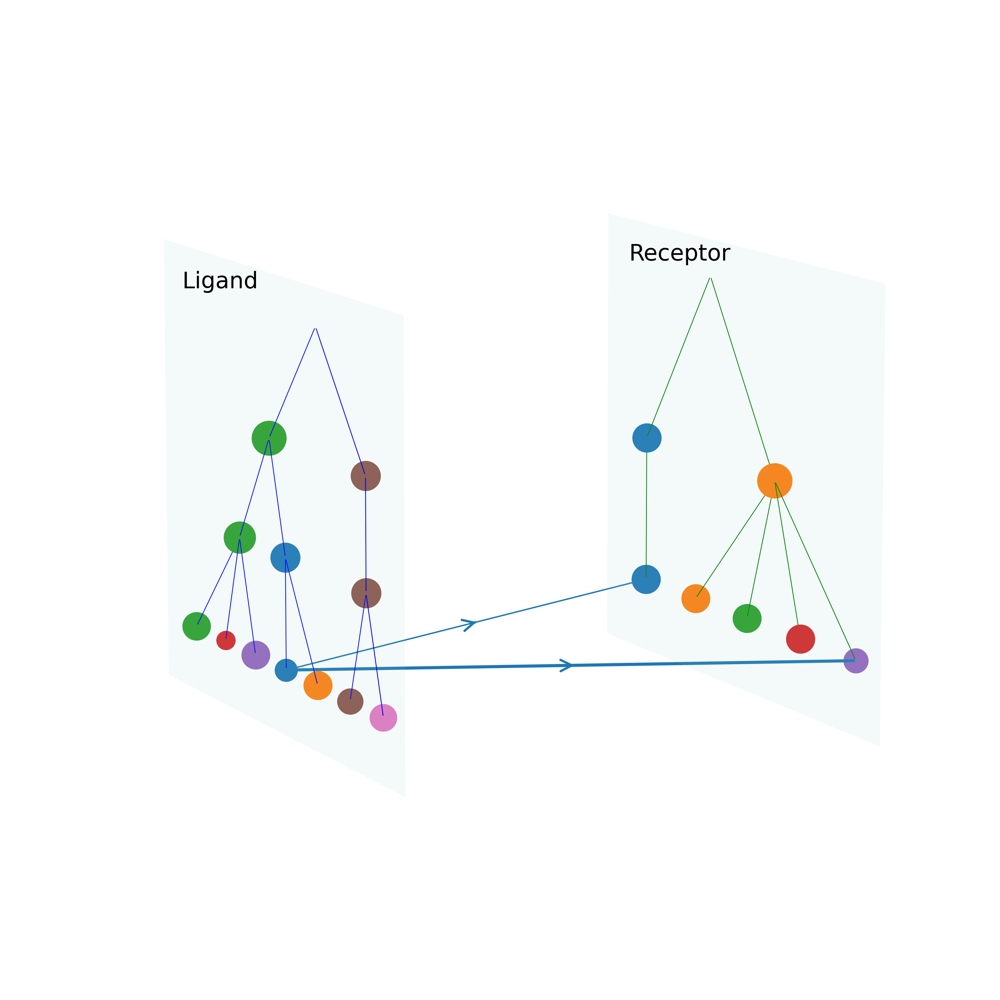

APP


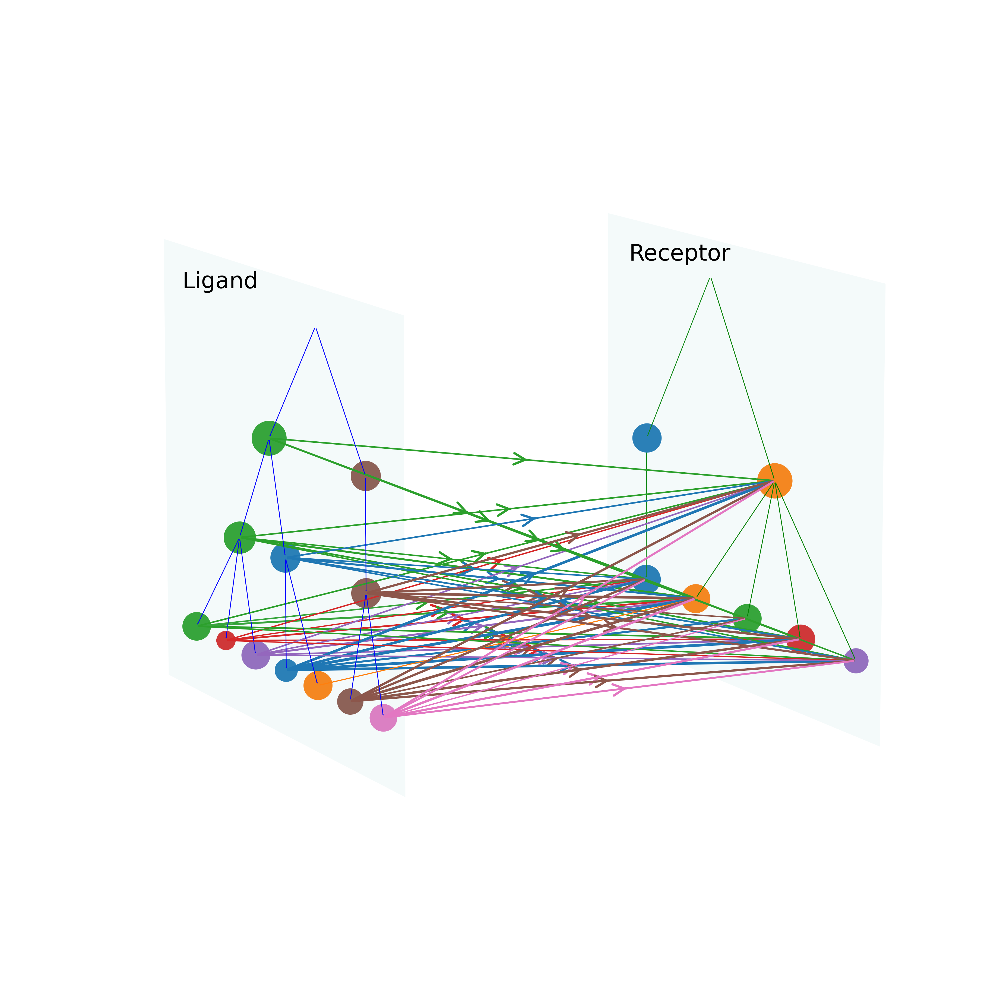

In [ ]:
for pathway in ['LT','CD22','MIF','BAFF','CD45','CLDN','ICAM','CXCL','APP']:
    print(pathway)
    pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
    CCI_mtx = get_CCI_mtx(all_LR_filtered, pathway_ligands, pathway_receptors, L_onehot_ls, R_onehot_ls,ligand_exp_dict,receptor_exp_dict,
                    cofactor_exp_dict, CCI_threshold=0.3)
    CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(L_onehot_ls))], axis=0) for r_level in range(len(R_onehot_ls))], axis=1)
    draw_CCI(L_onehot_ls, R_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1,save=f'{pathway}_CCI.pdf')


SN


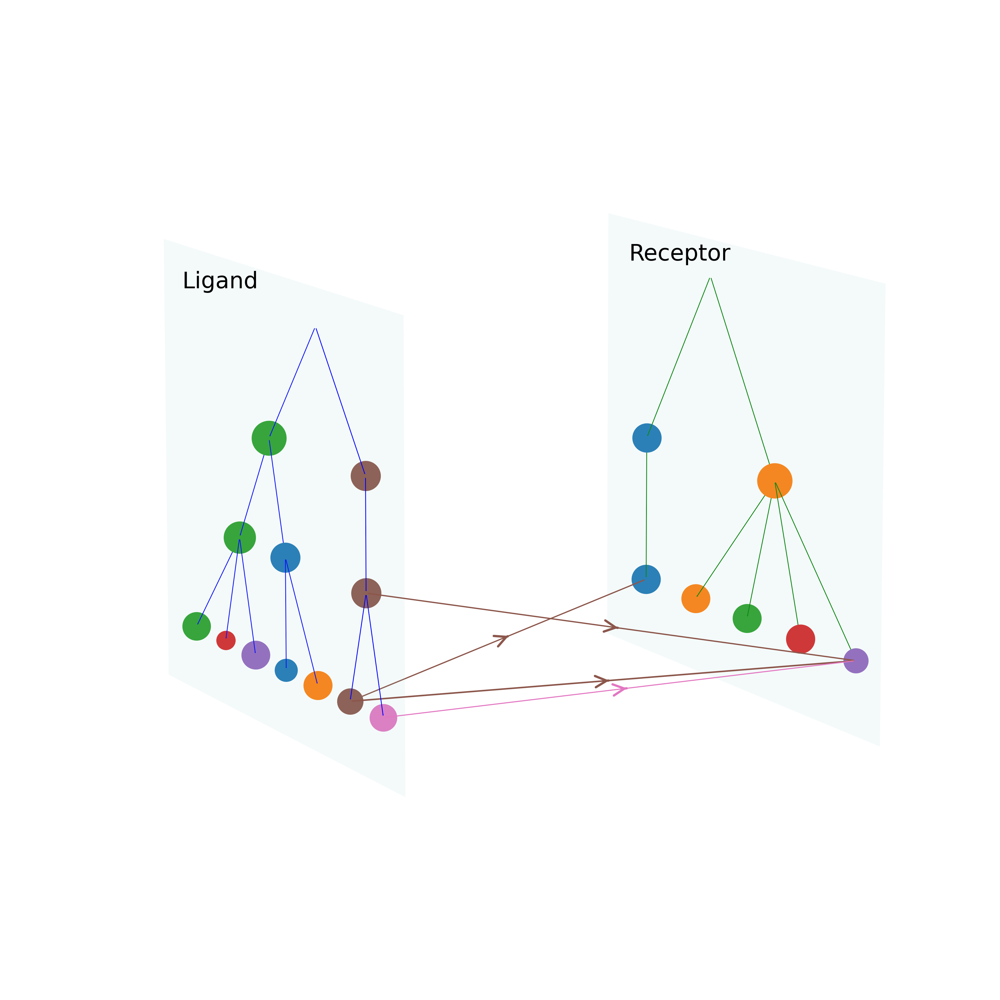

ANNEXIN


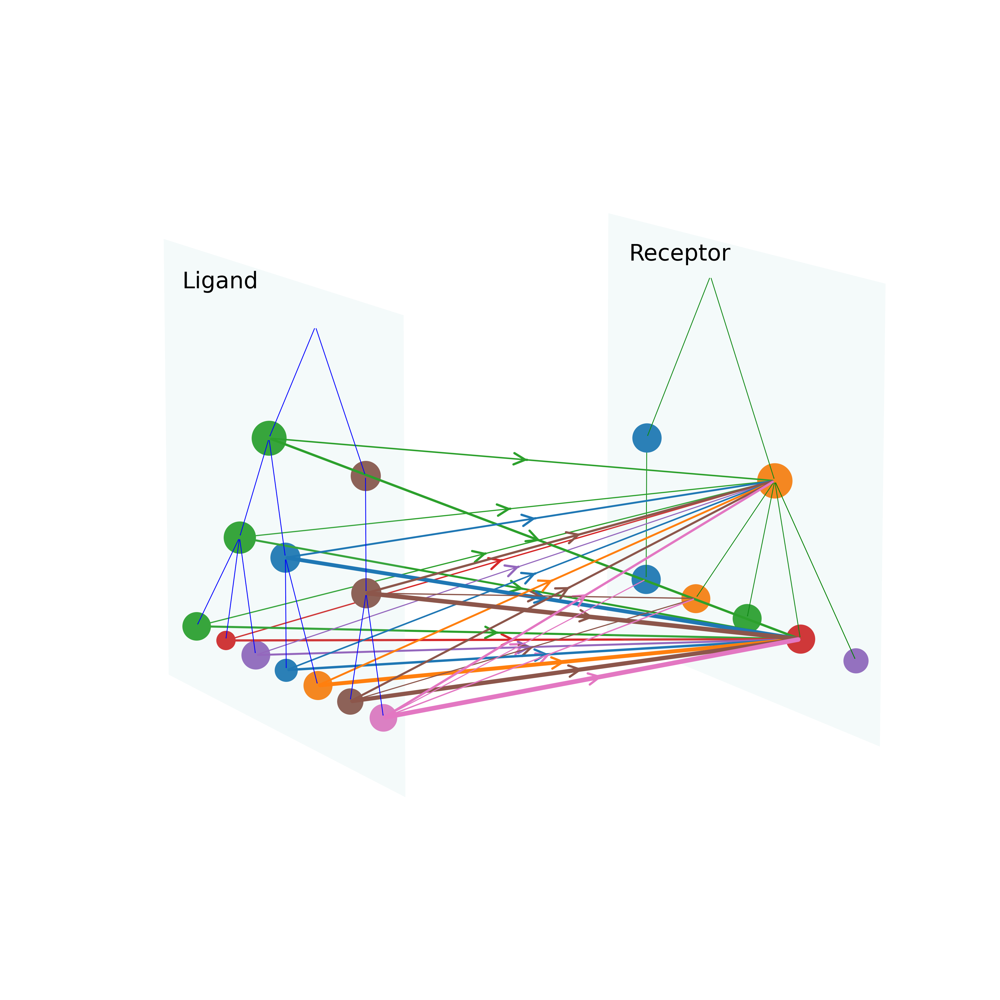

GRN


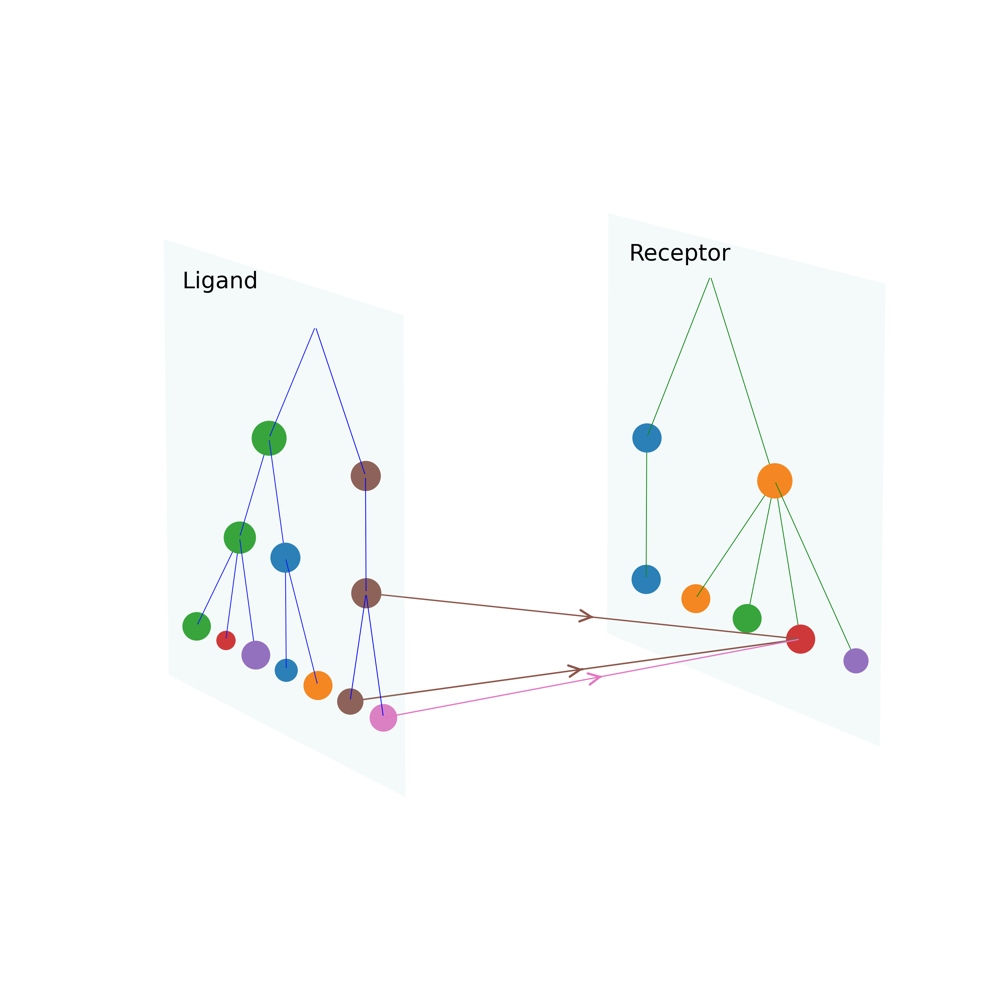

GALECTIN


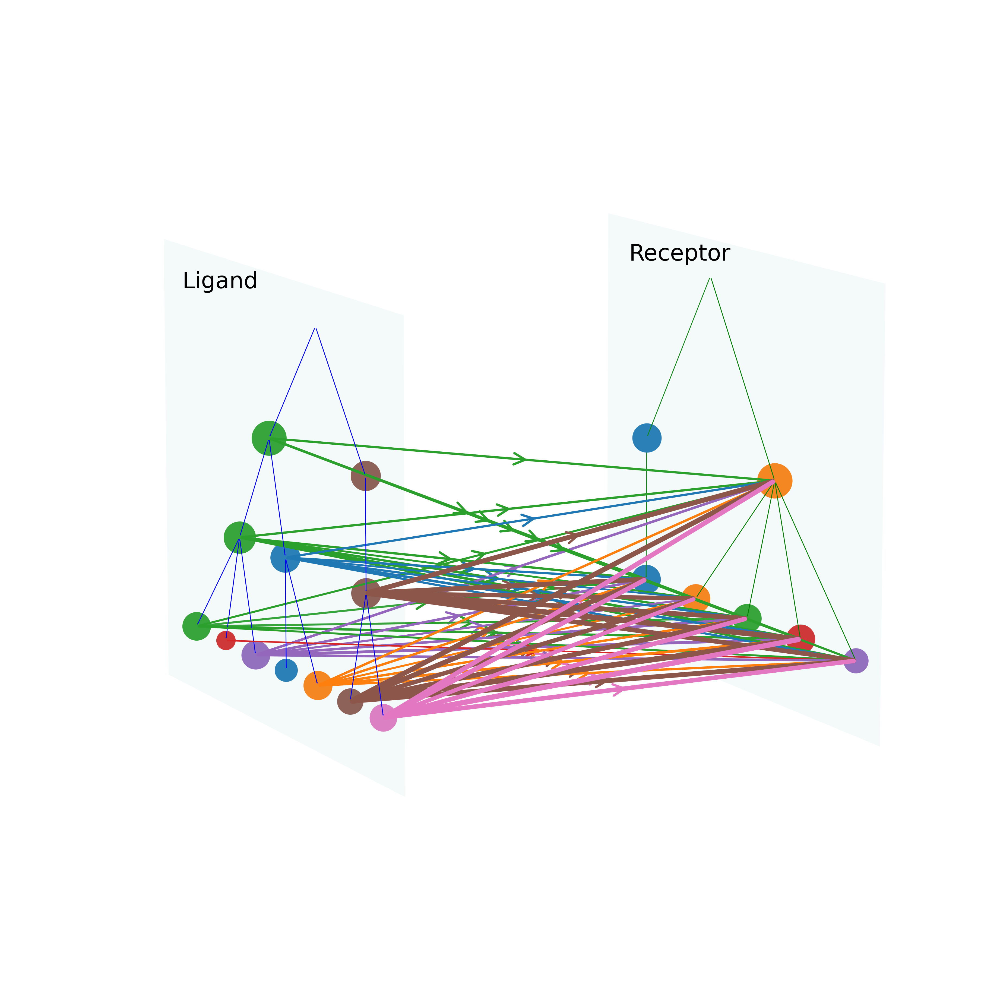

RESISTIN


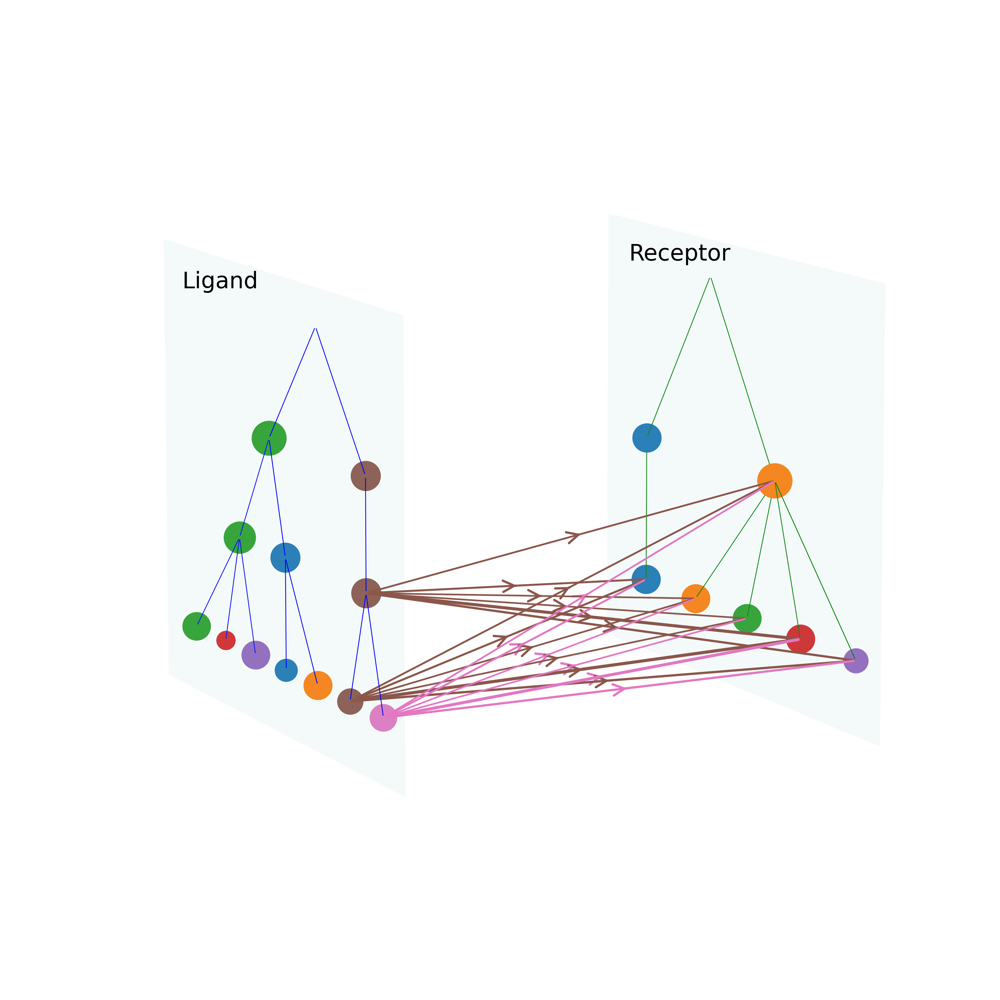

VISFATIN


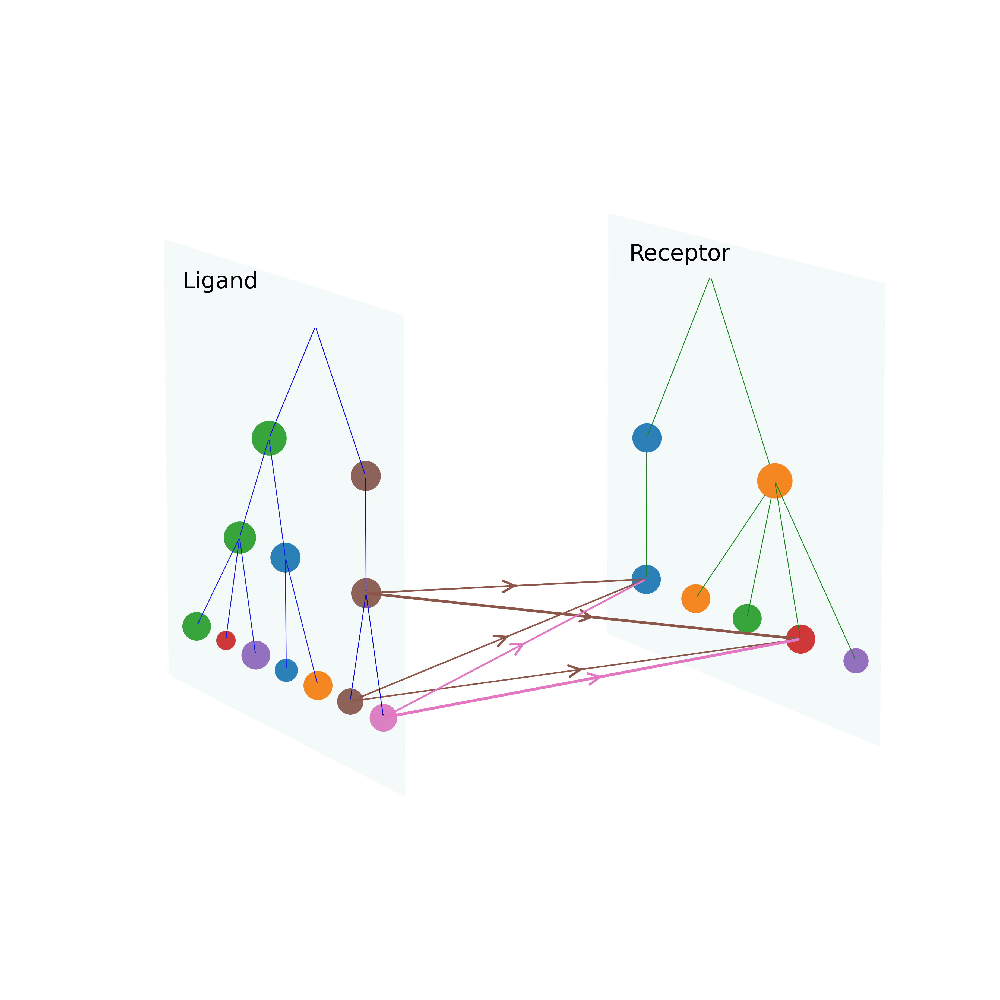

PECAM1


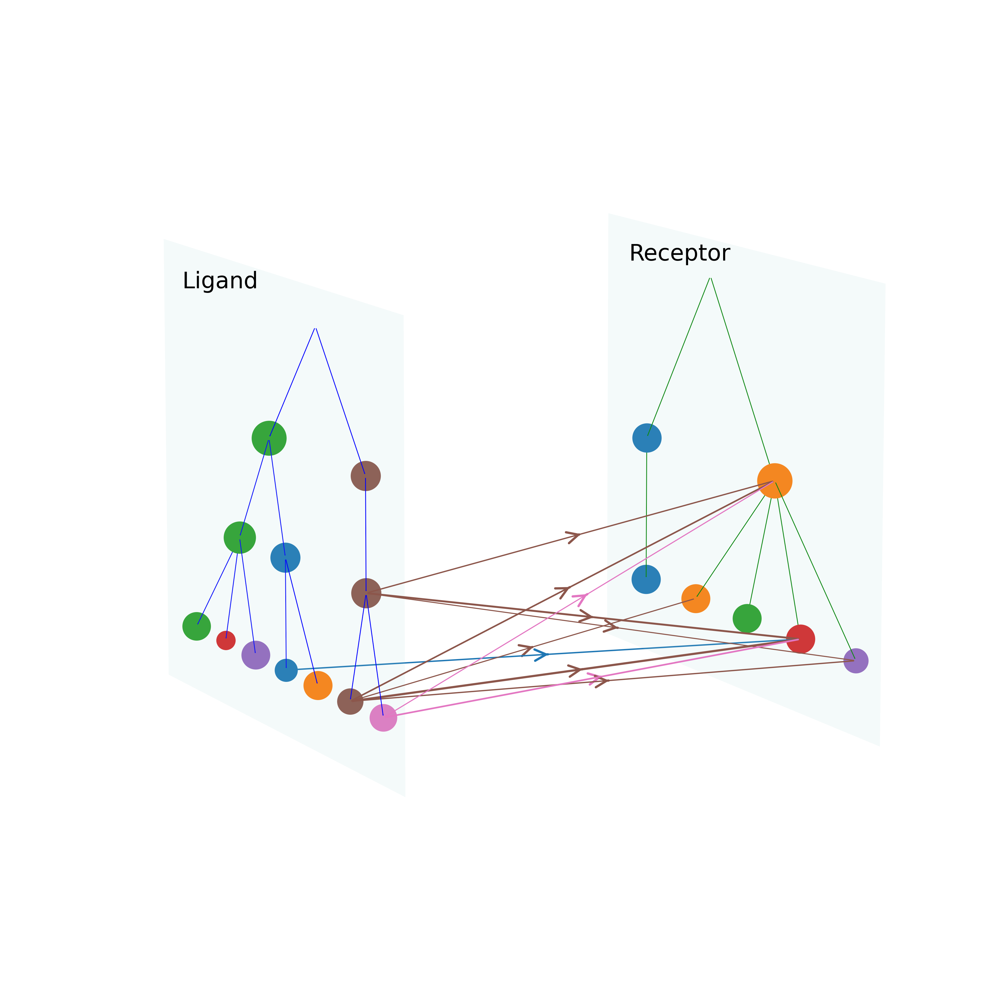

In [ ]:
for pathway in ['SN','ANNEXIN','GRN','GALECTIN','RESISTIN','VISFATIN','PECAM1']:
    print(pathway)
    pathway_ligands, pathway_receptors = get_pathway_genes(all_LR_filtered,pathway)
    CCI_mtx = get_CCI_mtx(all_LR_filtered, pathway_ligands, pathway_receptors, L_onehot_ls, R_onehot_ls,ligand_exp_dict,receptor_exp_dict,
                    cofactor_exp_dict, CCI_threshold=0.3)
    CCI_mtx = np.concatenate([np.concatenate([CCI_mtx[(l_level, r_level)] for l_level in range(len(L_onehot_ls))], axis=0) for r_level in range(len(R_onehot_ls))], axis=1)
    draw_CCI(L_onehot_ls, R_onehot_ls, CCI_mtx, L_node_mapping_dict=None, R_node_mapping_dict=None, L_is_general=True, R_is_general=True,CCI_linewidth=3,CCI_nodesize=1,save=f'{pathway}_CCI.pdf')

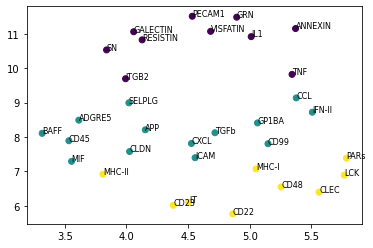

In [ ]:
pathway_LR_exp_in_clusters = [np.concatenate((pathway_L,pathway_R),axis=0) for pathway_L,pathway_R in zip(pathway_L_exp_in_clusters,pathway_R_exp_in_clusters)]
u,kmeans = cluster_exp_ls(pathway_L_exp_in_clusters,pathway_R_exp_in_clusters,L_all_results,R_all_results,L_comm_levels,R_comm_levels,nclusters=3)
fig, ax = plt.subplots()
ax.scatter(u[:, 0],u[:, 1],c=kmeans.labels_)
sampled_id = np.random.choice(len(pathways),size=int(len(pathways)),replace=False)
for i, pathway in enumerate(active_pathways):
    if i in sampled_id:
        ax.annotate(pathway, (u[i,0], u[i,1]),fontsize=8)

#plt.savefig('/Users/xinyiwang/Desktop/pathway_clustering.pdf')

CCI between MMT

In [ ]:
# Get multiple trees of ligands/receptors
stime = time.time()
ligand_trees = find_multiscale_trees(L_sup_mtx, remove_cells_prop=0.9,  support_size_threshold=30, inclusive_threshold=0.9, disjoint_threshold=0.98, tree_size=3, tree_scales=3)
receptor_trees = find_multiscale_trees(R_sup_mtx, remove_cells_prop=0.9,  support_size_threshold=30, inclusive_threshold=0.9, disjoint_threshold=0.98, tree_size=3, tree_scales=3)
print(time.time() - stime)

# Get indices of all ligands in L_ls in trees
orig_L_indices_in_trees = []
orig_R_indices_in_trees = []

for tree in ligand_trees:
    for node in tree.nodes:
        orig_L_indices_in_trees.append(node)

for tree in receptor_trees:
    for node in tree.nodes:
        orig_R_indices_in_trees.append(node)

L_indices_in_trees = list(set(orig_L_indices_in_trees))
R_indices_in_trees = list(set(orig_R_indices_in_trees))

print(len(ligand_trees))
print(len(receptor_trees))
print(len(L_indices_in_trees))
print(len(R_indices_in_trees))

2.176806926727295
3
54
5
39


In [ ]:
pathways

array(['ADGRE5', 'ALCAM', 'ANGPT', 'ANGPTL', 'ANNEXIN', 'APP', 'APRIL',
       'BAFF', 'BAG', 'BMP', 'BTLA', 'CADM', 'CALCR', 'CCL', 'CD137',
       'CD22', 'CD226', 'CD23', 'CD30', 'CD34', 'CD39', 'CD40', 'CD45',
       'CD46', 'CD48', 'CD6', 'CD70', 'CD80', 'CD86', 'CD96', 'CD99',
       'CDH', 'CDH1', 'CLDN', 'CLEC', 'CNTN', 'COMPLEMENT', 'CSF', 'CX3C',
       'CXCL', 'EPHA', 'EPHB', 'ESAM', 'FASLG', 'FGF', 'FLT3', 'GALECTIN',
       'GAS', 'GP1BA', 'GRN', 'ICAM', 'ICOS', 'IFN-II', 'IGF', 'IL1',
       'IL10', 'IL16', 'IL2', 'IL6', 'ITGB2', 'JAM', 'LCK', 'LEP',
       'LIGHT', 'LT', 'MHC-I', 'MHC-II', 'MIF', 'MK', 'MPZ', 'NCAM',
       'NECTIN', 'NEGR', 'NOTCH', 'NRG', 'OCLN', 'OPIOID', 'OX40', 'PARs',
       'PD-L1', 'PDGF', 'PECAM1', 'PROS', 'PSAP', 'PTPRM', 'PVR',
       'RESISTIN', 'SELL', 'SELPLG', 'SEMA3', 'SEMA4', 'SEMA5', 'SEMA7',
       'SN', 'TGFb', 'TIGIT', 'TNF', 'TRAIL', 'TWEAK', 'VEGF', 'VEGI',
       'VISFATIN'], dtype=object)

In [ ]:
ligands_in_trees = L_ls[L_indices_in_trees]
receptors_in_trees = R_ls[R_indices_in_trees]

count = 0
lr_pairs_in_trees = []
for lr_pair in all_LR_filtered[['Ligand','Receptor']].values:
     if lr_pair[0] in ligands_in_trees and lr_pair[1] in receptors_in_trees:
        count+=1
        lr_pairs_in_trees.append(lr_pair)

tree_ind_for_lr_pairs = []

for lr_pair in lr_pairs_in_trees:
    l_tree_ind = []
    for i in range(len(ligand_trees)):
        if lr_pair[0] in L_ls[list(ligand_trees[i].nodes)]:
            l_tree_ind.append(i)
    r_tree_ind = []
    for j in range(len(receptor_trees)):
        if lr_pair[1] in R_ls[list(receptor_trees[j].nodes)]:
            r_tree_ind.append(j)
    tree_ind_for_lr_pairs.append([l_tree_ind, r_tree_ind])

print(tree_ind_for_lr_pairs)

[[[2], [8, 34]], [[0, 1, 2], [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]], [[0, 1, 2], [8, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 36]]]


In [ ]:
L_tree_num = 0
R_tree_num = 0

L_node_pos = nx.nx_pydot.graphviz_layout(ligand_trees[L_tree_num], prog='dot')
L_node_level_dict = get_node_level_top_down(ligand_trees[L_tree_num])
R_node_pos = nx.nx_pydot.graphviz_layout(receptor_trees[R_tree_num], prog='dot')
R_node_level_dict = get_node_level_top_down(receptor_trees[R_tree_num])

tree_ligand_onehot_ls = []
for level in range(len(L_node_level_dict)):
    tree_ligand_onehot_ls.append(L_sup_mtx[L_node_level_dict[level]])
tree_receptor_onehot_ls = []
for level in range(len(R_node_level_dict)):
    tree_receptor_onehot_ls.append(R_sup_mtx[R_node_level_dict[level]])

L_node_ls = sum(L_node_level_dict.values(), [])
L_node_mapping_dict = dict()
R_node_ls = sum(R_node_level_dict.values(), [])
R_node_mapping_dict = dict()

for ind, node in enumerate(L_node_ls):
    L_node_mapping_dict[node] = ind
for ind, node in enumerate(R_node_ls):
    R_node_mapping_dict[node] = ind

L_size_ls = get_cluster_size_ls(tree_ligand_onehot_ls)
R_size_ls = get_cluster_size_ls(tree_receptor_onehot_ls)
ligands_ls = list(map(lambda x: x.upper(), L_ls[ligand_trees[L_tree_num].nodes]))
receptors_ls = list(map(lambda x: x.upper(), R_ls[receptor_trees[R_tree_num].nodes]))
'''
CCI = get_CCI_mtx(all_LR_filtered, ligands_ls, receptors_ls, tree_ligand_onehot_ls,
                    tree_receptor_onehot_ls, ligand_exp_dict,receptor_exp_dict, cofactor_exp_dict, CCI_threshold=0.3)

CCI_mtx = np.concatenate([np.concatenate([CCI[(l_level, r_level)] for l_level in range(len(tree_ligand_onehot_ls))], axis=0) for r_level in range(len(tree_receptor_onehot_ls))], axis=1)

#save = f'/Users/xinyiwang/Desktop/CrossChat_figures/LR_trees/L_tree_{tree_num}_interaction.pdf'
draw_CCI_between_MMT(ligand_trees[L_tree_num], L_node_pos, receptor_trees[R_tree_num], R_node_pos, L_size_ls, R_size_ls, CCI_mtx, L_node_mapping_dict=L_node_mapping_dict, R_node_mapping_dict=R_node_mapping_dict)
'''

"\nCCI = get_CCI_mtx(all_LR_filtered, ligands_ls, receptors_ls, tree_ligand_onehot_ls,\n                    tree_receptor_onehot_ls, ligand_exp_dict,receptor_exp_dict, cofactor_exp_dict, CCI_threshold=0.3)\n\nCCI_mtx = np.concatenate([np.concatenate([CCI[(l_level, r_level)] for l_level in range(len(tree_ligand_onehot_ls))], axis=0) for r_level in range(len(tree_receptor_onehot_ls))], axis=1)\n\n#save = f'/Users/xinyiwang/Desktop/CrossChat_figures/LR_trees/L_tree_{tree_num}_interaction.pdf'\ndraw_CCI_between_MMT(ligand_trees[L_tree_num], L_node_pos, receptor_trees[R_tree_num], R_node_pos, L_size_ls, R_size_ls, CCI_mtx, L_node_mapping_dict=L_node_mapping_dict, R_node_mapping_dict=R_node_mapping_dict)\n"

In [ ]:
L_ls[ligand_trees[L_tree_num].nodes]

array(['CCL20', 'TNFSF13B', 'CLDN11'], dtype=object)

In [ ]:
draw_MMT(ligand_trees[L_tree_num],L_node_pos,L_size_ls,lr_node_mapping_dict=L_node_mapping_dict,nodesize=5)

TypeError: draw_MMT() missing 1 required positional argument: 'lr_ls'

CCI between MMT of union LR

In [ ]:
# Get multiple trees of LR pairs
LR_sup_mtx = prepare_lr_union_sup_mtx(all_LR_filtered,L_sup_mtx,R_sup_mtx,L_ls,R_ls)

import time
stime = time.time()
lr_trees = find_multiscale_trees(LR_sup_mtx, remove_cells_prop=0.9,  support_size_threshold=30, inclusive_threshold=0.95, disjoint_threshold=0.95, tree_size=10, tree_scales=3)
print(time.time() - stime)

# Get indices of all LR pairs in lr_trees
orig_lr_indices_in_trees = []

for tree in lr_trees:
    for node in tree.nodes:
        orig_lr_indices_in_trees.append(node)

lr_indices_in_trees = list(set(orig_lr_indices_in_trees))

print(len(lr_trees))
print(len(lr_indices_in_trees))

In [ ]:
LR_union_tree_num = 2
LR_union_tree_node_ls = list(lr_trees[LR_union_tree_num].nodes)
LR_union_tree = lr_trees[LR_union_tree_num]

LR_union_node_pos = nx.nx_pydot.graphviz_layout(lr_trees[LR_union_tree_num], prog='dot')
LR_union_node_mapping_dict = dict()
for i,node in enumerate(LR_union_tree_node_ls):
    LR_union_node_mapping_dict[node] = i

tree_ligand_onehot_ls = []
tree_receptor_onehot_ls = []
CCI_vector = []
# Draw node colors according to tree_ligand_ind_ls
tree_ligand_ind_ls = []
tree_receptor_ind_ls = []
for node in LR_union_tree_node_ls:
    L_ind = np.where(L_ls==all_LR_filtered.iloc[node]['Ligand'])[0][0]
    R_ind = np.where(R_ls==all_LR_filtered.iloc[node]['Receptor'])[0][0]
    tree_ligand_ind_ls.append(L_ind)
    tree_receptor_ind_ls.append(R_ind)
    tree_ligand_onehot_ls.append(L_sup_mtx[L_ind])
    tree_receptor_onehot_ls.append(R_sup_mtx[R_ind])
    ligands_ls = [all_LR_filtered.iloc[node]['Ligand']]
    receptors_ls = [all_LR_filtered.iloc[node]['Receptor']]
    CCI = compute_interaction(node,L_sup_mtx[L_ind],R_sup_mtx[R_ind],all_LR_filtered,ligand_exp_dict,receptor_exp_dict,cofactor_exp_dict)
    if CCI>0.3:
        CCI_vector.append(CCI)
    else:
        CCI_vector.append(0)

L_size_ls = np.sum(tree_ligand_onehot_ls,axis=1)/ncells
R_size_ls = np.sum(tree_receptor_onehot_ls,axis=1)/ncells
L_color_ls = []
R_color_ls = []
for node in tree_ligand_ind_ls:
    L_color_ls.append(np.where(list(set(tree_ligand_ind_ls))==node)[0][0] % 10)
for node in tree_receptor_ind_ls:
    R_color_ls.append(np.where(list(set(tree_receptor_ind_ls))==node)[0][0] % 10)

#save = f'/Users/xinyiwang/Desktop/CrossChat_figures/LR_trees/L_tree_{tree_num}_interaction.pdf'
draw_CCI_between_LR_union_MMT(LR_union_tree, LR_union_node_pos, L_size_ls, R_size_ls, L_color_ls, R_color_ls, CCI_vector, LR_union_node_mapping_dict=LR_union_node_mapping_dict, save=None)